# DGF AI Analysis

## Importing Necessary libraries

In [4]:
import pandas as pd
import numpy as np
import pprint
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

## Dataset Background

In [26]:
df = pd.read_csv('DGF_AI_project_data_20241105.csv')

In [27]:
df.columns

Index(['study_id', 'txdate', 'dgf', 'crr2', 'crr2_lt30', 'rage', 'rsex',
       'rwhite', 'rbmi', 'tdialyr', 'pkpracat0', 'num_comorb', 'rhist_dm',
       'rhist_chd', 'rhist_chf', 'rhist_stroke', 'rhist_pvd', 'rhist_cld',
       'rhist_skin_cancer', 'rhist_non_skin_cancer', 'dage', 'dsex', 'dtype',
       'dbmi', 'ddeathcause_cva', 'cit', 'ecd', 'dcd', 'regraft', 'inductype',
       'cni_disch', 'txera', 'statusdt_censored', 'status', 'bpar',
       'first_bpardt', 'first_re_admdt'],
      dtype='object')

| **Variable Name**       | **Label**                                               | **Note**                                                                 |
|-------------------------|---------------------------------------------------------|-------------------------------------------------------------------------|
| `study_id`              | Study ID                                                |                                                                         |
| `txdate`                | Date of transplant (yyyy-mm-dd)                         |                                                                         |
| `dgf`                   | Delayed graft function (Yes vs. No)                     |                                                                         |
| `crr2`                  | Creatinine reduction ratio                              |                                                                         |
| `crr2_lt30`             | Creatinine reduction ratio (<=30% vs. >30%)             |                                                                         |
| `rage`                  | Recipient age (years)                                   |                                                                         |
| `rsex`                  | Recipient sex (Male vs. Female)                         |                                                                         |
| `rwhite`                | Recipient race (White vs. Non-White)                    |                                                                         |
| `rbmi`                  | Recipient BMI (kg/m²)                                   |                                                                         |
| `tdialyr`               | Time on dialysis before transplant (years)              |                                                                         |
| `pkpracat0`             | Peak PRA (=0% vs. >0%)                                  |                                                                         |
| `num_comorb`            | Number of comorbidities                                 | The comorbidities include recipient history of diabetes mellitus, coronary heart disease, congestive heart failure, stroke, peripheral vascular disease, chronic lung disease, skin cancer, non-skin cancer. |
| `rhist_dm`              | Recipient history of diabetes mellitus (Yes vs. No)     |                                                                         |
| `rhist_chd`             | Recipient history of coronary heart disease (Yes vs. No)|                                                                         |
| `rhist_chf`             | Recipient history of congestive heart failure (Yes vs. No)|                                                                       |
| `rhist_stroke`          | Recipient history of stroke (Yes vs. No)                |                                                                         |
| `rhist_pvd`             | Recipient history of peripheral vascular disease (Yes vs. No)|                                                                     |
| `rhist_cld`             | Recipient history of chronic lung disease (Yes vs. No)  |                                                                         |
| `rhist_skin_cancer`     | Recipient history of skin cancer (Yes vs. No)           |                                                                         |
| `rhist_non_skin_cancer` | Recipient history of non-skin cancer (Yes vs. No)       |                                                                         |
| `dage`                  | Donor age (years)                                       |                                                                         |
| `dsex`                  | Donor sex (Male vs. Female)                             |                                                                         |
| `dtype`                 | Donor type (Deceased)                                   |                                                                         |
| `dbmi`                  | Donor BMI (kg/m²)                                       |                                                                         |
| `ddeathcause_cva`       | Stroke or cerebrovascular accident as donor cause of death|                                                                     |
| `cit`                   | Cold ischemic time (hours)                              |                                                                         |
| `ecd`                   | Expanded criteria donors (ECD) status                   |                                                                         |
| `dcd`                   | Death by circulatory criteria donor (DCCD) status       |                                                                         |
| `regraft`               | Re-graft (0=No, 1=Yes)                                  |                                                                         |
| `inductype`             | Induction type (Depleting agent vs. Non-depleting agent)|                                                                         |
| `cni_disch`             | CNI type at discharge (Tacrolimus vs. Cyclosporine)     |                                                                         |
| `txera`                 | Transplant era                                          |                                                                         |
| `statusdt_censored`     | Recipient vital status date (yyyy-mm-dd)                |                                                                         |
| `status`                | Recipient vital status                                  |                                                                         |
| `bpar`                  | Biopsy-proven acute rejection (0=No, 1=Yes)             |                                                                         |
| `first_bpardt`          | First biopsy-proven acute rejection date (yyyy-mm-dd)   |                                                                         |
| `first_re_admdt`        | Recipient first re-admission date after transplant discharge (yyyy-mm-dd)|                                                         |


## Exploratory Data Analysis

### 1.  Understanding the Target Variable, `DGF`

**Checking the distribution of our target variable, DGF (`dgf`)**. This will help me decide on potential strategies for model training, such as resampling techniques or weighted losses.

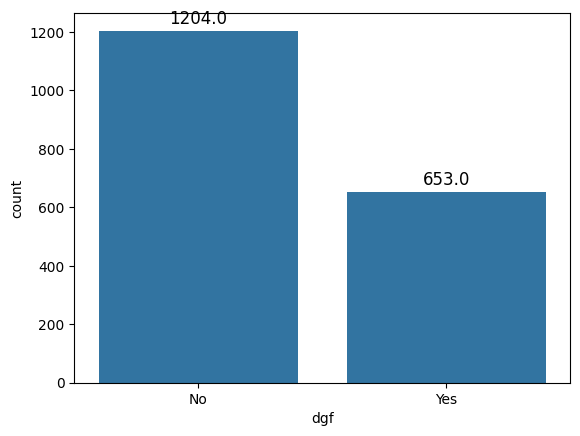

In [7]:
# Create the count plot
ax = sns.countplot(x='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

**Calculate the percentage of cases with and without DGF. This gives an idea of how rare DGF is in the dataset.**

In [8]:
df['dgf'].value_counts(normalize=True)

dgf
No     0.648358
Yes    0.351642
Name: proportion, dtype: float64

We see there are 35.16% (653) patients with DGF and 64.84% (1204) patients with no DGF

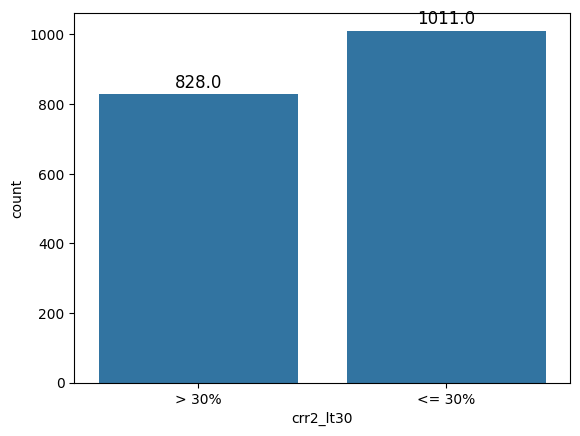

In [10]:
# Create the count plot
ax = sns.countplot(x='crr2_lt30', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [12]:
df['crr2_lt30'].value_counts(normalize=True)

crr2_lt30
<= 30%    0.549755
> 30%     0.450245
Name: proportion, dtype: float64

We see there are 55.01% (1011) patients with crr2 <= 30% (which indicates it has no DGF) and 44.99% (827) patients with crr2 > 30% (which indicates it has DGF)

### 2. Univariate Analysis (Distribution of Individual Variables) and Bivariate Analysis on DGF

- **Numerical Variables**: I would like to plot histograms and boxplots for continuous variables like `creatinine reduction ratio (crr2)`, `recipient age (rage)`, `donor BMI (dbmi)`, `cold ischemic time (cit)`, and `time on dialysis before transplant (tdialyr)`. I am Looking for skewness and data distribution.

<Axes: xlabel='rage', ylabel='Count'>

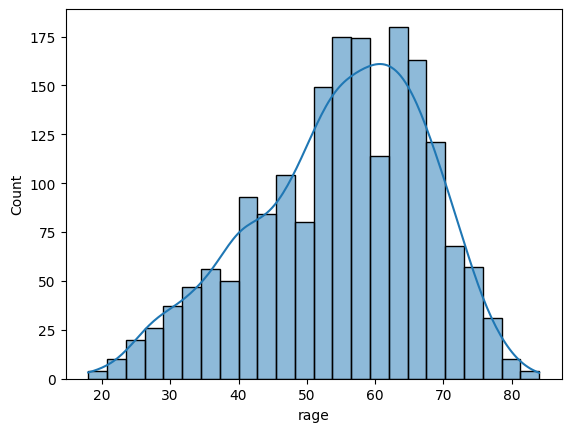

In [17]:
sns.histplot(df['rage'], kde=True)

**We see that the Recipient Age is mostly around 50 - 70 years old**

<Axes: xlabel='crr2', ylabel='Count'>

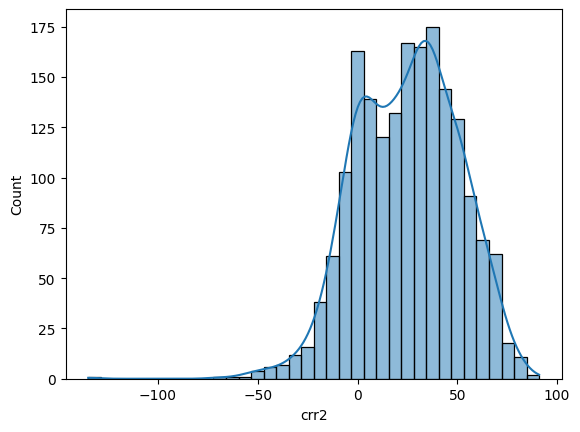

In [16]:
sns.histplot(df['crr2'], kde=True)

**The creatinine reduction ratio mostly between -40 to 80**

/tmp/ipykernel_310795/1026860107.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['crr2_cluster', 'dgf']).size().unstack(fill_value=0)


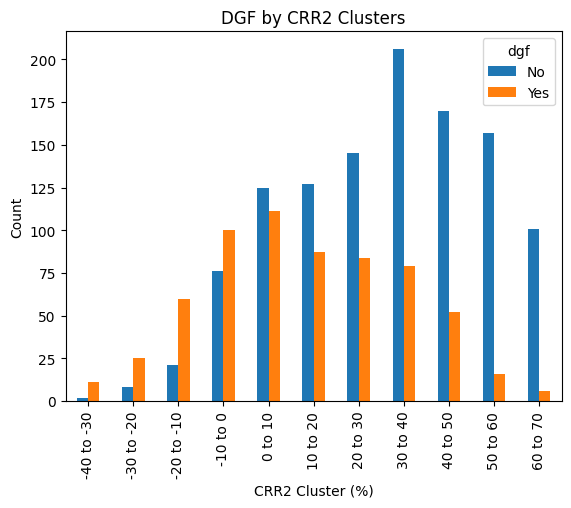

In [157]:
# Define the bins and labels
bins = list(range(-40, 80, 10))
labels = [f'{i} to {i+10}' for i in range(-40, 70, 10)]

# Create clusters for 'crr2'
df['crr2_cluster'] = pd.cut(df['crr2'], bins=bins, labels=labels, right=False)

# Group by the new clusters and DGF
grouped = df.groupby(['crr2_cluster', 'dgf']).size().unstack(fill_value=0)

# Plot the results
grouped.plot(kind='bar')
plt.xlabel('CRR2 Cluster (%)')
plt.ylabel('Count')
plt.title('DGF by CRR2 Clusters')
plt.show()

In [158]:
# Calculate the ratio of DGF 'yes' in pracat0 categories
ratio_df = df.groupby('crr2_cluster')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['crr2_cluster', 'DGF_yes_ratio']

ratio_df

/tmp/ipykernel_310795/4017233068.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ratio_df = df.groupby('crr2_cluster')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()


,crr2_cluster,DGF_yes_ratio
0,-40 to -30,0.846154
1,-30 to -20,0.757576
2,-20 to -10,0.740741
3,-10 to 0,0.568182
4,0 to 10,0.470339
5,10 to 20,0.406542
6,20 to 30,0.366812
7,30 to 40,0.277193
8,40 to 50,0.234234
9,50 to 60,0.092486


**In Summary, the higher the CRR, the less likely patients have DGF.**

### Interpretation of Results

1. **High Negative CRR2 Clusters (-40 to -30, -30 to -20, -20 to -10)**:
   - **DGF_yes_ratio**: 0.846154, 0.757576, 0.740741
   - **Interpretation**: These clusters have the highest ratios of DGF, indicating that a significant majority of patients with highly negative CRR2 values (indicating a large increase in creatinine levels) experience DGF. This suggests poor initial kidney function post-transplant.

2. **Moderate Negative to Zero CRR2 Clusters (-10 to 0)**:
   - **DGF_yes_ratio**: 0.568182
   - **Interpretation**: The ratio decreases but remains relatively high, indicating that patients with moderate negative to zero CRR2 values still have a considerable likelihood of experiencing DGF.

3. **Positive CRR2 Clusters (0 to 10, 10 to 20, 20 to 30)**:
   - **DGF_yes_ratio**: 0.470339, 0.406542, 0.366812
   - **Interpretation**: As CRR2 values become positive, the ratio of DGF decreases. This suggests that as the kidney starts to function better (indicated by a reduction in creatinine levels), the likelihood of DGF decreases.

4. **Higher Positive CRR2 Clusters (30 to 40, 40 to 50, 50 to 60, 60 to 70)**:
   - **DGF_yes_ratio**: 0.277193, 0.234234, 0.092486, 0.056075
   - **Interpretation**: These clusters have the lowest ratios of DGF, indicating that patients with higher positive CRR2 values (indicating a significant reduction in creatinine levels) are much less likely to experience DGF. This suggests good initial kidney function post-transplant.

### Overall Trend
- **Negative CRR2 Values**: Higher likelihood of DGF, indicating poor kidney function.
- **Positive CRR2 Values**: Lower likelihood of DGF, indicating better kidney function.

### Clinical Implications
- **Monitoring CRR2**: Regular monitoring of CRR2 can help in early identification of patients at risk of DGF.
- **Intervention Strategies**: Patients with highly negative CRR2 values may require more intensive monitoring and intervention to improve kidney function and reduce the risk of DGF.



<Axes: xlabel='cit', ylabel='Count'>

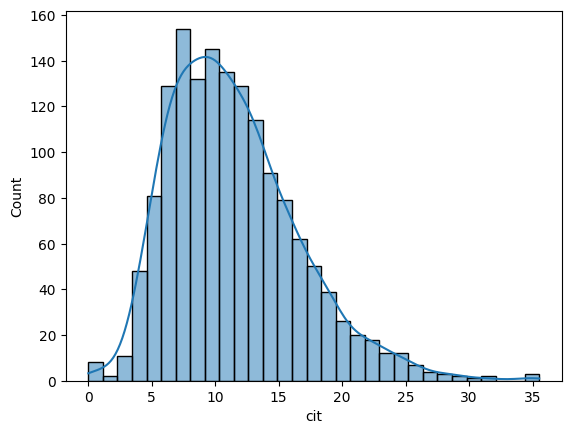

In [24]:
sns.histplot(df['cit'], kde=True)

**The Cold Ischemic Time mostly between 5 to 15 hours**

/tmp/ipykernel_310795/3198471023.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['cit_cluster', 'dgf']).size().unstack(fill_value=0)


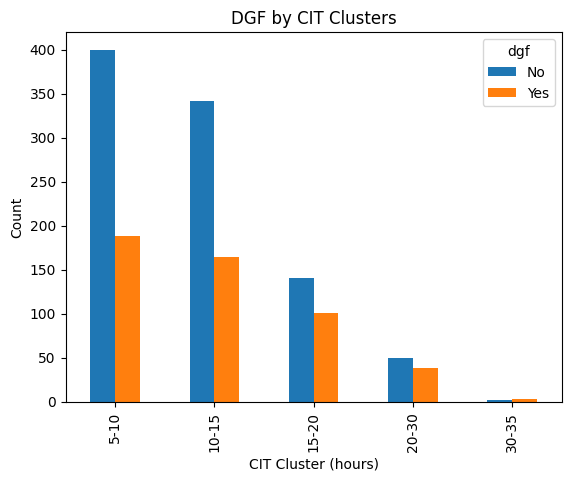

In [65]:
# Define the bins and labels
bins = [5, 10, 15, 20, 30, 35]
labels = ['5-10', '10-15', '15-20', '20-30', '30-35']

# Create clusters for 'cit'
df['cit_cluster'] = pd.cut(df['cit'], bins=bins, labels=labels, right=False)

# Group by the new clusters and DGF
grouped = df.groupby(['cit_cluster', 'dgf']).size().unstack(fill_value=0)

# Plot the results
grouped.plot(kind='bar')
plt.xlabel('CIT Cluster (hours)')
plt.ylabel('Count')
plt.title('DGF by CIT Clusters')
plt.show()

In [66]:
# Calculate the ratio of DGF 'yes' in cit categories
ratio_df = df.groupby('cit_cluster')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['cit_cluster', 'DGF_yes_ratio']

ratio_df

/tmp/ipykernel_310795/444124198.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ratio_df = df.groupby('cit_cluster')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()


,cit_cluster,DGF_yes_ratio
0,5-10,0.319728
1,10-15,0.324111
2,15-20,0.417355
3,20-30,0.436782
4,30-35,0.600000


**We were unable to process data for periods under 5 hours due to insufficient sample size, which could introduce bias. Regarding cold ischemic time, we observe a trend indicating that longer storage durations are associated with a higher probability of delayed graft function (DGF).**

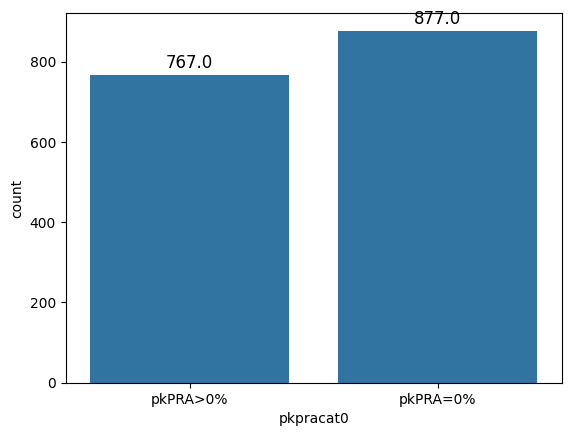

In [43]:
# Create the count plot
ax = sns.countplot(x='pkpracat0', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [44]:
df['pkpracat0'].value_counts(normalize=True)

pkpracat0
pkPRA=0%    0.533455
pkPRA>0%    0.466545
Name: proportion, dtype: float64

**There are 877 (53.35%) patients with 0% peak PRA and 767 (46.35%) patients with >0 peak PRA in this dataset**

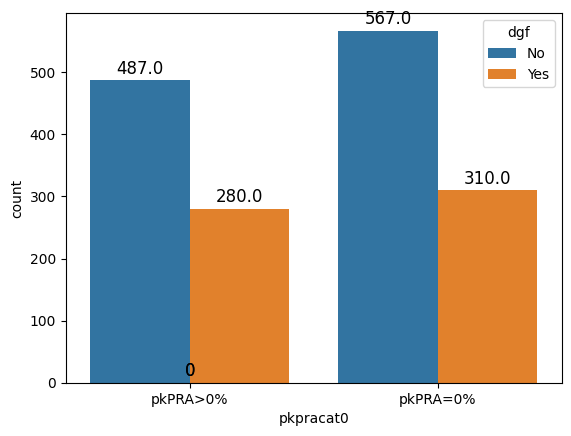

In [38]:
# Create the count plot
ax = sns.countplot(x='pkpracat0', hue='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [42]:
# Calculate the ratio of DGF 'yes' in pracat0 categories
ratio_df = df.groupby('pkpracat0')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['pkpracat0', 'DGF_yes_ratio']

ratio_df

,pkpracat0,DGF_yes_ratio
0,pkPRA=0%,0.353478
1,pkPRA>0%,0.365059


**We also see that although not significant, patients with >0% peak PRA have higher probability with DGF than patients with 0% peak PRA**

<Axes: xlabel='dbmi', ylabel='Count'>

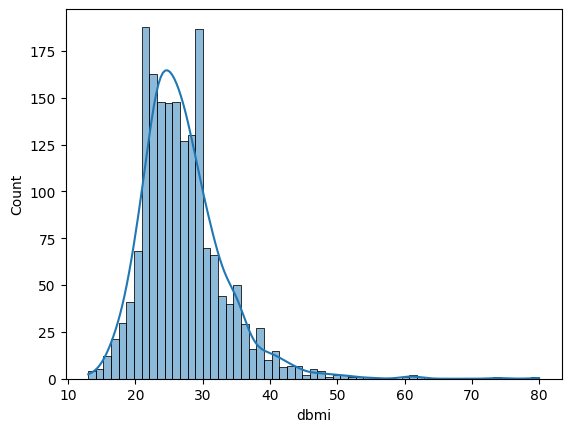

In [5]:
sns.histplot(df['dbmi'], kde=True)

**The Distribution of BMI is stacked around 20 - 30 (kg/m^2)**

<Axes: xlabel='tdialyr', ylabel='Count'>

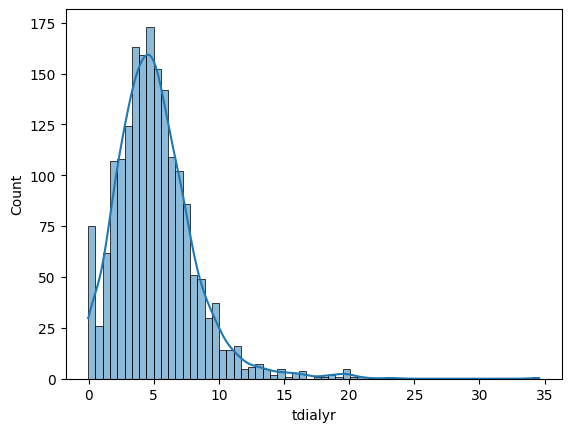

In [14]:
sns.histplot(df['tdialyr'], kde=True)

**The Time on Dialysis Before Transplant mostly around 5 years**

/tmp/ipykernel_310795/803184929.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(['tdialyr_cluster', 'dgf']).size().unstack(fill_value=0)


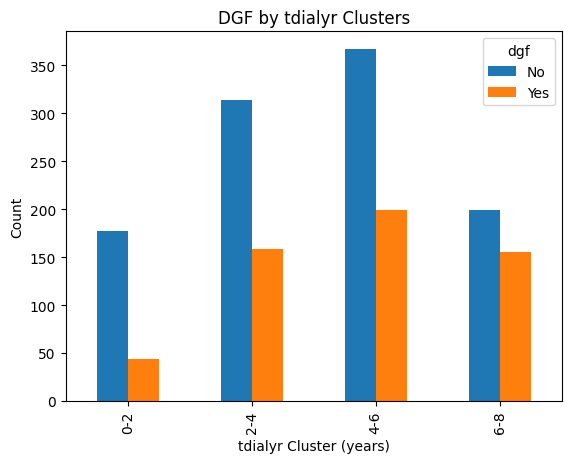

In [77]:
# Define the bins and labels
bins = [0, 2, 4, 6, 8]
labels = ['0-2', '2-4', '4-6', '6-8']

# Create clusters for 'tdialyr'
df['tdialyr_cluster'] = pd.cut(df['tdialyr'], bins=bins, labels=labels, right=False)

# Group by the new clusters and DGF
grouped = df.groupby(['tdialyr_cluster', 'dgf']).size().unstack(fill_value=0)

# Plot the results
grouped.plot(kind='bar')
plt.xlabel('tdialyr Cluster (years)')
plt.ylabel('Count')
plt.title('DGF by tdialyr Clusters')
plt.show()

In [78]:
# Calculate the ratio of DGF 'yes' in tdialyr categories
ratio_df = df.groupby('tdialyr_cluster')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['tdialyr_cluster', 'DGF_yes_ratio']

ratio_df

/tmp/ipykernel_310795/411293207.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ratio_df = df.groupby('tdialyr_cluster')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()


,tdialyr_cluster,DGF_yes_ratio
0,0-2,0.199095
1,2-4,0.336152
2,4-6,0.351590
3,6-8,0.437853


**We observe that the longer patients undergo dialysis, the higher the probability they will experience delayed graft function (DGF).**

- **Categorical Variables**: I would like to use bar plots to visualize the distribution of categorical variables such as `rsex` (sex), `rwhite` (race), `inductype` (induction type), `cni_disch` (CNI type).

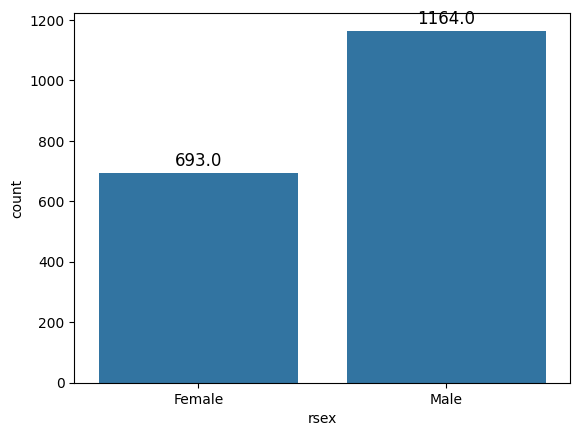

In [20]:
# Create the count plot
ax = sns.countplot(x='rsex', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [35]:
df['rsex'].value_counts(normalize=True)

rsex
Male      0.626817
Female    0.373183
Name: proportion, dtype: float64

**We see there are 37.32% (693) male patients and 62.68% (1164) female patients**

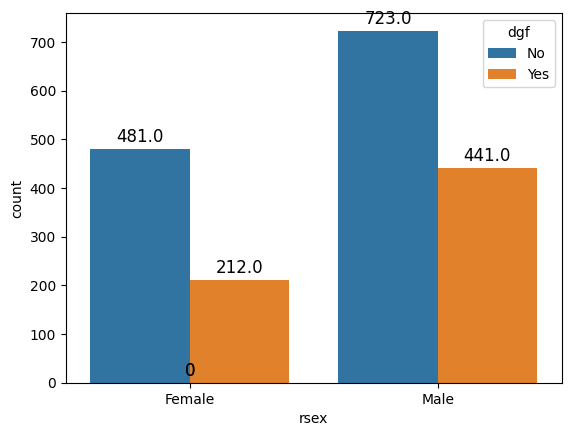

In [79]:
# Create the count plot
ax = sns.countplot(x='rsex', hue='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [80]:
# Calculate the ratio of DGF 'yes' in sex categories
ratio_df = df.groupby('rsex')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['rsex', 'DGF_yes_ratio']

ratio_df

,rsex,DGF_yes_ratio
0,Female,0.305916
1,Male,0.378866


**We observe that the male patients have the higher probability with DGF**

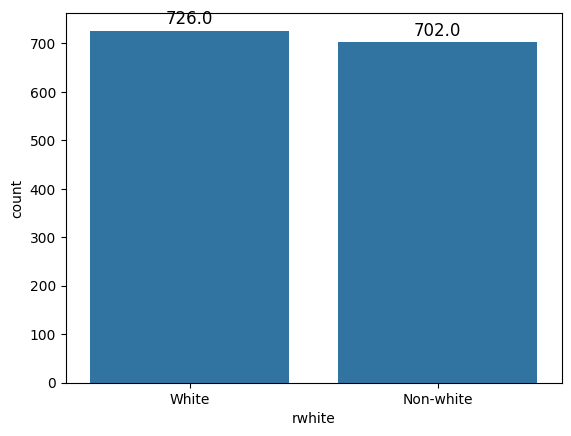

In [22]:
# Create the count plot
ax = sns.countplot(x='rwhite', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [36]:
df['rwhite'].value_counts(normalize=True)

rwhite
White        0.508403
Non-white    0.491597
Name: proportion, dtype: float64

**We see there are 50.84% (726) white patients and 49.16% (702) non-white patients**

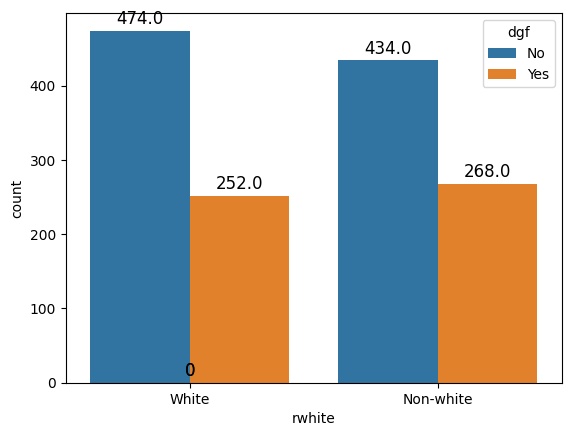

In [81]:
# Create the count plot
ax = sns.countplot(x='rwhite', hue='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [82]:
# Calculate the ratio of DGF 'yes' in race categories
ratio_df = df.groupby('rwhite')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['rwhite', 'DGF_yes_ratio']

ratio_df

,rwhite,DGF_yes_ratio
0,Non-white,0.381766
1,White,0.347107


**We observe that the Non-white patients have the higher probability with DGF**

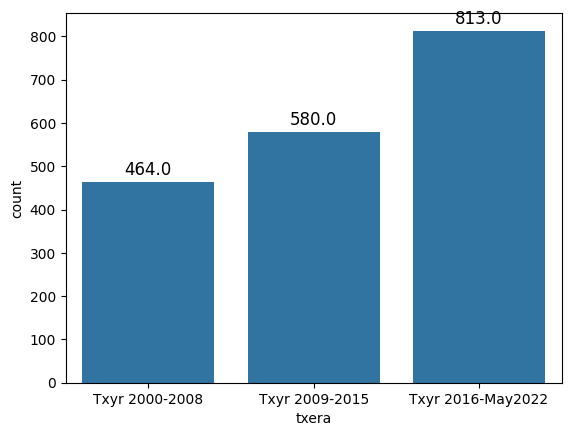

In [23]:
# Create the count plot
ax = sns.countplot(x='txera', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [40]:
df['txera'].value_counts(normalize=True)

txera
Txyr 2016-May2022    0.437803
Txyr 2009-2015       0.312332
Txyr 2000-2008       0.249865
Name: proportion, dtype: float64

**We see there are 43.78% (813) patients in the transplant era 2016-May2022 and 31.23% (580) patients in 2009-2015 and 24.99% (464) patients in 2000 - 2008**

<Axes: xlabel='txera', ylabel='count'>

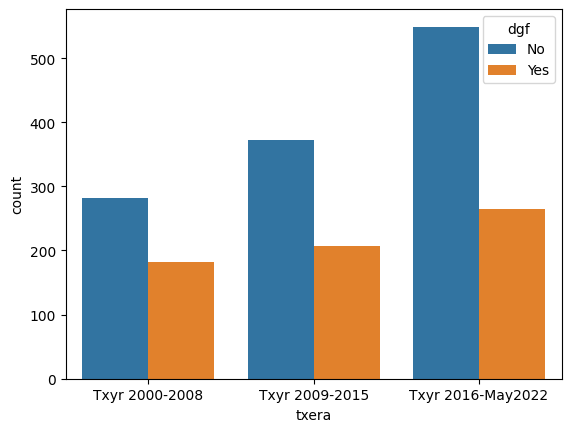

In [25]:
sns.countplot(x='txera', hue='dgf', data=df)

In [45]:
# Calculate the ratio of DGF 'yes' in pracat0 categories
ratio_df = df.groupby('txera')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['txera', 'DGF_yes_ratio']

ratio_df

,txera,DGF_yes_ratio
0,Txyr 2000-2008,0.392241
1,Txyr 2009-2015,0.356897
2,Txyr 2016-May2022,0.324723


**We also see the later the era, the probability of Patients with DGF is decreasing, which means the Transplant process becomes better**

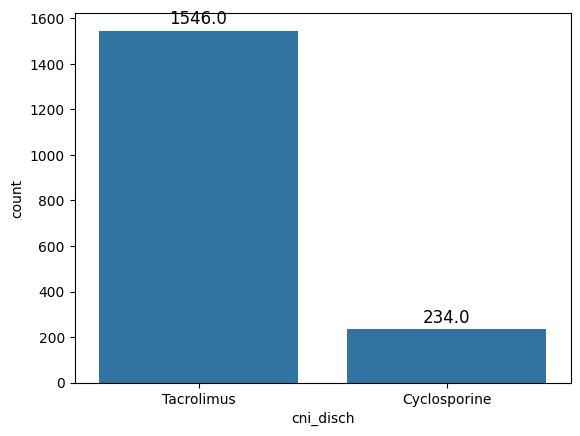

In [25]:
# Create the count plot
ax = sns.countplot(x='cni_disch', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [41]:
df['cni_disch'].value_counts(normalize=True)

cni_disch
Tacrolimus      0.868539
Cyclosporine    0.131461
Name: proportion, dtype: float64

**We see there are 86.85% (1546) patients with Calcineurin inhibitors (CNI) type Tacrolimus and 13.15% (234) patients with CNI type Cyclosporine**

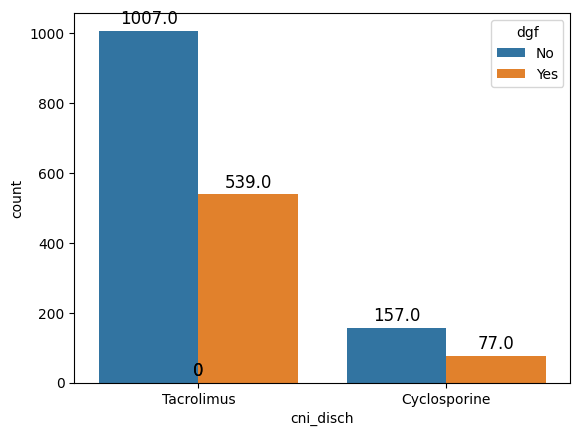

In [84]:
# Create the count plot
ax = sns.countplot(x='cni_disch', hue='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [85]:
# Calculate the ratio of DGF 'yes' in cni discharge categories
ratio_df = df.groupby('cni_disch')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['cni_disch', 'DGF_yes_ratio']

ratio_df

,cni_disch,DGF_yes_ratio
0,Cyclosporine,0.329060
1,Tacrolimus,0.348642


- The data suggests that the incidence of DGF is slightly higher in patients discharged with Tacrolimus compared to those discharged with Cyclosporine.
- However, the difference is relatively small, indicating that both CNIs have a comparable impact on the likelihood of experiencing DGF.

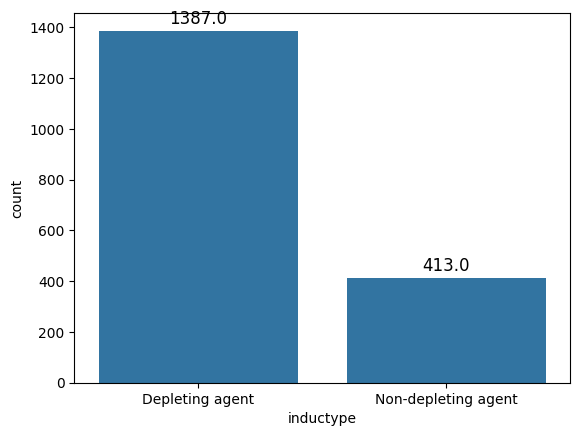

In [26]:
# Create the count plot
ax = sns.countplot(x='inductype', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [43]:
df['inductype'].value_counts(normalize=True)

inductype
Depleting agent        0.770556
Non-depleting agent    0.229444
Name: proportion, dtype: float64

**We see there are 77.06% (1387) patients with depleting agent induction and 22.94% (413) patients with non-depleting agent induction**

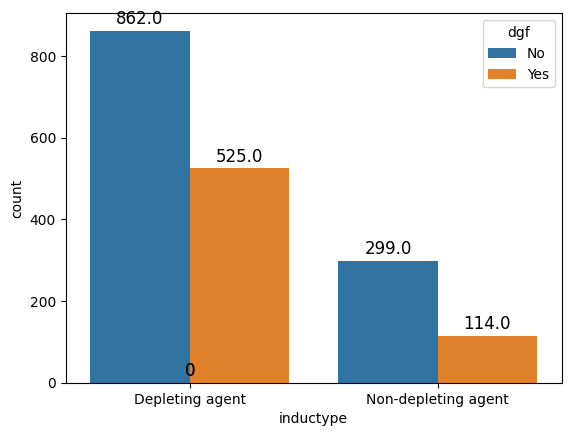

In [86]:
# Create the count plot
ax = sns.countplot(x='inductype', hue='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [87]:
# Calculate the ratio of DGF 'yes' in induction type categories
ratio_df = df.groupby('inductype')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['inductype', 'DGF_yes_ratio']

ratio_df

,inductype,DGF_yes_ratio
0,Depleting agent,0.378515
1,Non-depleting agent,0.276029


- The data suggests that the incidence of DGF is higher in patients who received depleting agents compared to those who received non-depleting agents.
- This aligns with the understanding that while depleting agents are effective in reducing acute rejection, their intense immunosuppressive effects can lead to complications such as infections, which may contribute to DGF.

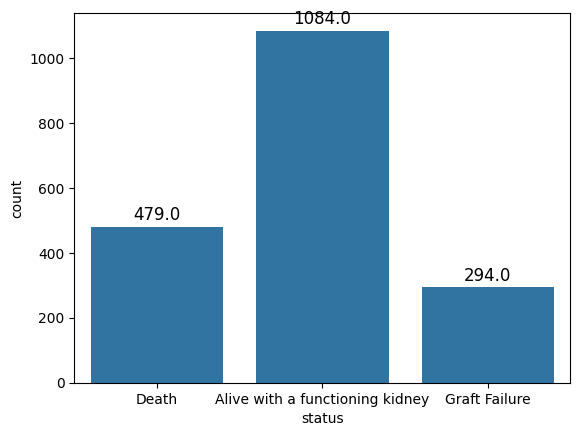

In [105]:
# Create the count plot
ax = sns.countplot(x='status', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [109]:
# Calculate total counts
total_counts = df['status'].value_counts()

# Calculate normalized counts (percentages)
normalized_counts = df['status'].value_counts(normalize=True)

# Combine both into a single DataFrame
counts_df = pd.DataFrame({'Total': total_counts, 'Normalized': normalized_counts})

counts_df


,Total,Normalized
status,,
Alive with a functioning kidney,1084,0.583737
Death,479,0.257943
Graft Failure,294,0.158320


**We see that 58.37% (1084) of patients are alive with a functioning kidney, 25.79% (479) have died, and 15.83% (294) have experienced graft failure.**

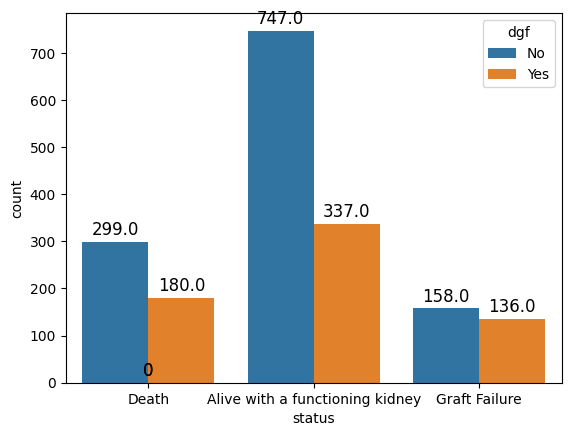

In [111]:
# Create the count plot
ax = sns.countplot(x='status', hue='dgf', data=df)

# Add labels on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

# Show the plot
plt.show()

In [112]:
# Calculate the ratio of DGF 'yes' in status categories
ratio_df = df.groupby('status')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['status', 'DGF_yes_ratio']

ratio_df

,status,DGF_yes_ratio
0,Alive with a functioning kidney,0.310886
1,Death,0.375783
2,Graft Failure,0.462585


- The data suggests that the incidence of DGF is higher in patients who experienced graft failure (46.26%) compared to those who died (37.58%) and those who are alive with a functioning kidney (31.09%).
- This aligns with the understanding that delayed graft function is associated with poorer outcomes, as it can lead to complications that increase the risk of graft failure and mortality.

### **Analyzing Relationship between the impact of Donor Age and Recipient Age on DGF**

<Axes: xlabel='dage', ylabel='rage'>

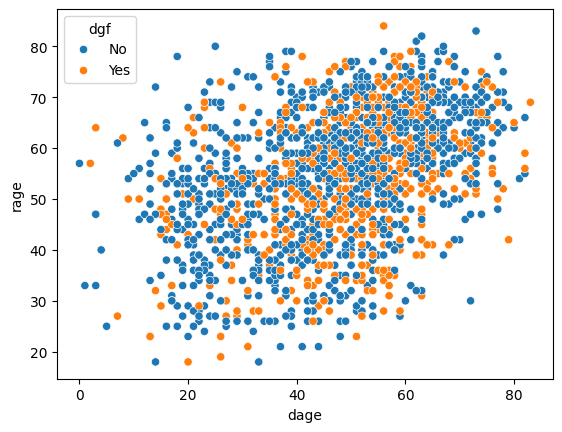

In [14]:
sns.scatterplot(x='dage', y='rage', hue='dgf', data=df)

The scatterplot provides insights into the potential impact of **Recipient Age** (rage) and **Donor Age** (dage) on **Delayed Graft Function (DGF)**.

### Key Observations

#### 1. **Donor Age Impact on DGF**:
   - There is a noticeable increase in **orange dots** (DGF occurrences) as donor age increases.
   - **Older donors (above 40 years)** seem to have a higher likelihood of DGF occurring, suggesting that **older donor age may be a risk factor for DGF**.
   - Conversely, **younger donors (20-40 years)** tend to be associated with fewer DGF cases (fewer orange dots), indicating **better graft outcomes** with younger donors.

#### 2. **Recipient Age Impact on DGF**:
   - Unlike donor age, **recipient age does not show a clear trend** in relation to DGF. Orange dots representing DGF are scattered across all recipient ages.
   - Both younger and older recipients appear to experience DGF at relatively similar rates, implying that **recipient age alone may not be a strong predictor of DGF**.

#### 3. **Age Mismatch and DGF**:
   - There doesn’t seem to be a strong correlation between **donor-recipient age differences** and DGF, as the points are fairly dispersed.
   - DGF cases occur across a wide range of both donor and recipient age pairings, suggesting that the **age gap between the donor and recipient** may not be a critical factor in predicting DGF.

#### 4. **Clustering Patterns**:
   - The **blue dots** (No DGF) cluster more densely in the **younger donor age range (20-40 years)**, suggesting that **younger donor age is generally associated with lower DGF risk**, regardless of recipient age.
   - For **older donors**, there is a mix of both DGF and non-DGF cases, but DGF cases (orange dots) become more common.

#### Conclusion:
- **Donor age** appears to have a stronger impact on DGF than recipient age. Older donor organs are associated with a higher risk of DGF, while younger donor organs seem to result in better outcomes.
- **Recipient age** does not show a clear relationship with DGF in this scatterplot, indicating that other factors may be more important in predicting DGF outcomes for recipients.

### **Analyzing Relationship between the impact of Donor BMI and Recipient BMI on DGF**

<Axes: xlabel='dbmi', ylabel='rbmi'>

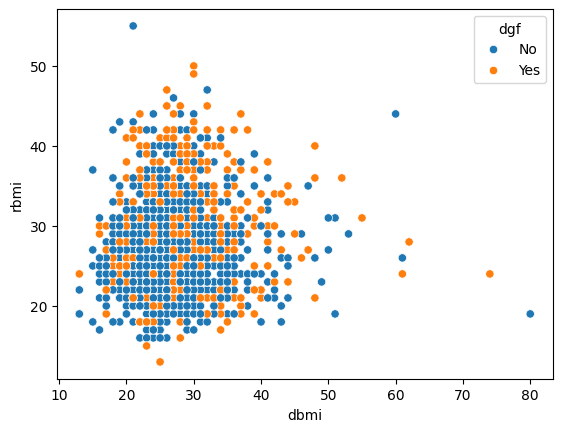

In [5]:
sns.scatterplot(x='dbmi', y='rbmi', hue='dgf', data=df)

The scatterplot examines the relationship between **Donor BMI (dbmi)** and **Recipient BMI (rbmi)** and their impact on **Delayed Graft Function (DGF)**. H

### **Key Observations**

#### 1. **Donor BMI (dbmi) Impact on DGF**:
   - **Higher Donor BMI (above 35)** shows more **orange dots** (DGF cases), suggesting a trend where higher donor BMI might be linked to an increased risk of DGF. 
   - For **lower donor BMI (below 35)**, both **blue (No DGF)** and **orange dots** (Yes DGF) are present, indicating a more mixed impact of donor BMI in this range. However, there seems to be a slight clustering of **No DGF cases** in the **20-30 BMI range**.
   - **Extremely high donor BMI values (50-80)** show mostly DGF cases (orange dots), which implies that **morbidly obese donors** may pose a higher risk for DGF in recipients.

#### 2. **Recipient BMI (rbmi) Impact on DGF**:
   - The **recipient BMI** also does not show a clear trend similar to the donor BMI. The **orange dots** (DGF cases) are scattered across the range of **recipient BMI** values, implying that **recipient BMI** alone may not be a strong predictor of DGF.
   - Both **blue (No DGF)** and **orange (Yes DGF)** dots are present throughout the recipient BMI range, suggesting no obvious trend correlating recipient BMI with DGF risk.

#### 3. **BMI Mismatch and DGF**:
   - There isn’t a clear pattern in the **BMI mismatch** between donor and recipient and its effect on DGF. The dots are fairly dispersed across the donor and recipient BMI axes.
   - While **higher donor BMI** might slightly increase the DGF risk, this pattern is not as evident when considering the BMI gap between donor and recipient.

#### 4. **Clustering Patterns**:
   - The **blue dots** (No DGF) seem more densely clustered between **20-35 donor BMI** and **20-40 recipient BMI**, which may indicate that having a donor and recipient within this BMI range results in better outcomes (lower risk of DGF).
   - As BMI increases for both donor and recipient, **DGF cases** (orange dots) become more frequent, particularly with **higher donor BMI**.

### Conclusion:
- **Donor BMI** appears to have a somewhat stronger influence on DGF risk than recipient BMI. **Higher donor BMI values** (especially over 35) are associated with an increase in DGF cases.
- **Recipient BMI** does not exhibit a clear relationship with DGF, suggesting that other factors may play a more significant role.
- No substantial pattern of **BMI mismatch** (difference between donor and recipient BMI) emerges as a critical factor in DGF risk from this scatterplot.

### **Time-Based Analysis Between DGF and First Readmission Date After Transplant Discharge**

<Axes: xlabel='days_to_readmission', ylabel='Count'>

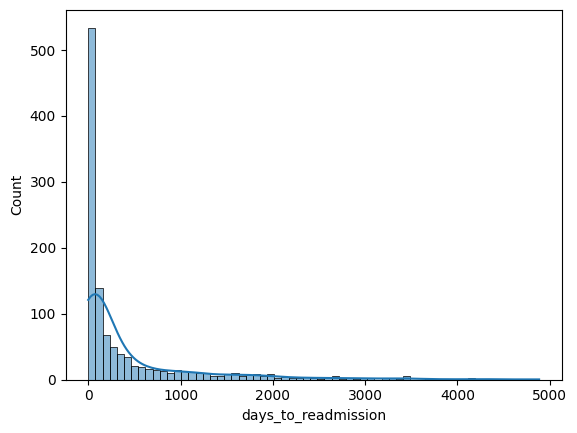

In [6]:
# Convert first_re_admdt and transplant_date to datetime
df['first_re_admdt'] = pd.to_datetime(df['first_re_admdt'], errors='coerce')
df['txdate'] = pd.to_datetime(df['txdate'], errors='coerce')

# Calculate the time difference in days between transplant and first readmission
df['days_to_readmission'] = (df['first_re_admdt'] - df['txdate']).dt.days

# Drop rows with missing values in the new column
df_cleaned = df.dropna(subset=['days_to_readmission'])

# Visualize the distribution of days_to_readmission for DGF and Non-DGF patients
sns.histplot(df['days_to_readmission'], kde=True)

**We could see the days to readmission is staked between 0 to 100, so let's make bins from 0 to 100**

/tmp/ipykernel_703349/1357962938.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['days_to_readmission_bin'] = pd.cut(df_cleaned['days_to_readmission'], bins=bins, labels=labels, right=False)


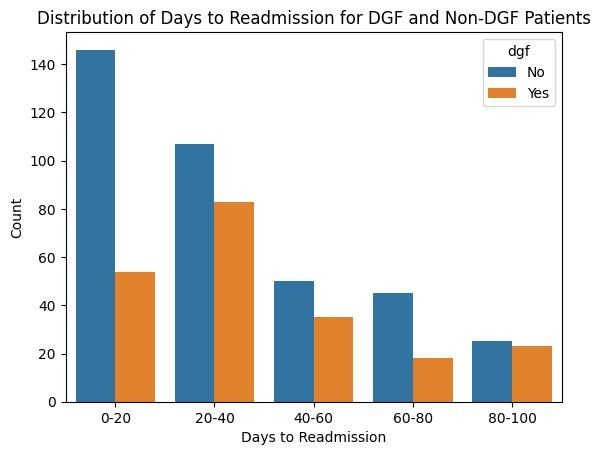

In [7]:
# Create bins from 0 to 120 days with differences of 20
bins = list(range(0, 120, 20))
labels = [f'{i}-{i+20}' for i in range(0, 100, 20)]

# Assign bins to the 'days_to_readmission' column
df_cleaned['days_to_readmission_bin'] = pd.cut(df_cleaned['days_to_readmission'], bins=bins, labels=labels, right=False)

# Visualize the distribution of days_to_readmission for DGF and Non-DGF patients using countplot
sns.countplot(data=df_cleaned, x='days_to_readmission_bin', hue='dgf')
plt.xlabel('Days to Readmission')
plt.ylabel('Count')
plt.title('Distribution of Days to Readmission for DGF and Non-DGF Patients')
plt.show()

In [143]:
# Calculate the ratio of DGF 'yes' in status categories
ratio_df = df_cleaned.groupby('days_to_readmission_bin')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()
ratio_df.columns = ['days_to_readmission_bin', 'DGF_yes_ratio']

ratio_df

/tmp/ipykernel_310795/3553670104.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ratio_df = df_cleaned.groupby('days_to_readmission_bin')['dgf'].apply(lambda x: (x == 'Yes').mean()).reset_index()


,days_to_readmission_bin,DGF_yes_ratio
0,0-20,0.270000
1,20-40,0.436842
2,40-60,0.411765
3,60-80,0.285714
4,80-100,0.479167


### Key Insights:

1. **Early Readmission (0-20 Days)**:
   - The ratio of DGF patients in this group is **27%**.
   - The majority of readmissions in the first 20 days are **non-DGF** patients.
   - This suggests that **early post-transplant complications** leading to readmission are **less likely related to DGF** and more likely caused by other factors like surgical recovery or immediate post-transplant issues.

2. **Increased DGF Risk (20-40 Days)**:
   - The DGF ratio spikes to **43.7%**.
   - This suggests that **DGF-related complications are more likely to emerge between 20 and 40 days post-transplant**, leading to higher rates of readmission for these patients.
   - DGF appears to contribute significantly to complications during this period.

3. **Continued Risk (40-60 Days)**:
   - The DGF ratio remains relatively high at **41.2%** in the 40-60 day range.
   - While there is a slight decrease from the previous period, the ratio remains high, suggesting that **DGF patients are still at substantial risk for complications leading to readmission** during this period.

4. **Moderate DGF Impact (60-80 Days)**:
   - The DGF ratio drops to **28.6%**, indicating that **non-DGF patients are more likely to be readmitted** in this period.
   - This could indicate a decline in DGF-related readmissions as patients either stabilize or complications are addressed earlier.

5. **Late Complications (80-100 Days)**:
   - The DGF ratio reaches **47.9%**, the highest of all periods.
   - This suggests that **long-term complications** related to DGF may manifest later, leading to readmissions beyond 80 days post-transplant.
   - DGF may have a delayed impact, with patients facing **chronic issues or longer-term graft function problems** that cause them to be readmitted after a longer period.

### Overall Impact of Longer Days to Readmission:
- **Early Readmission (0-20 days)**: DGF is **less influential** in early readmissions, indicating that immediate post-transplant issues are not primarily due to DGF.
- **Mid-term Readmission (20-60 days)**: **Significant DGF-related complications** occur during this period, with DGF patients having a higher probability of readmission.
- **Longer-term Readmission (60-100 days)**: The risk of readmission due to DGF **increases again**, particularly in the **80-100 day range**, suggesting that DGF can have a prolonged impact on transplant recipients.

This data shows that **DGF can have a substantial impact on readmission risk**, especially as time passes, with both mid-term and long-term periods showing elevated readmission rates for DGF patients.

### **Time-based Analysis Between DGF and Recipient Vital Status Date**

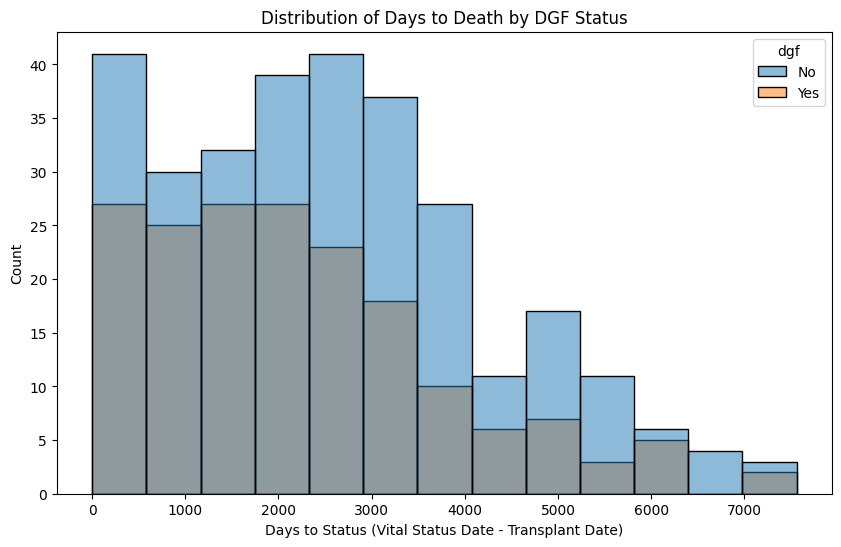

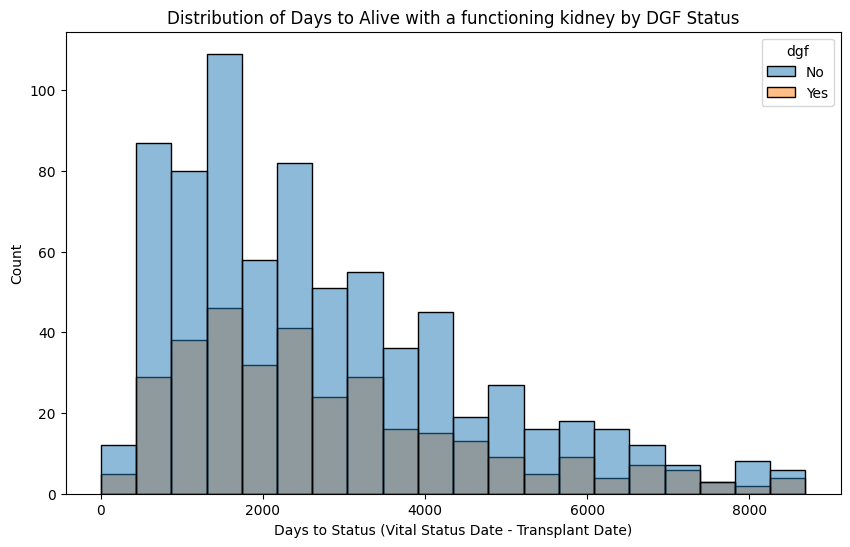

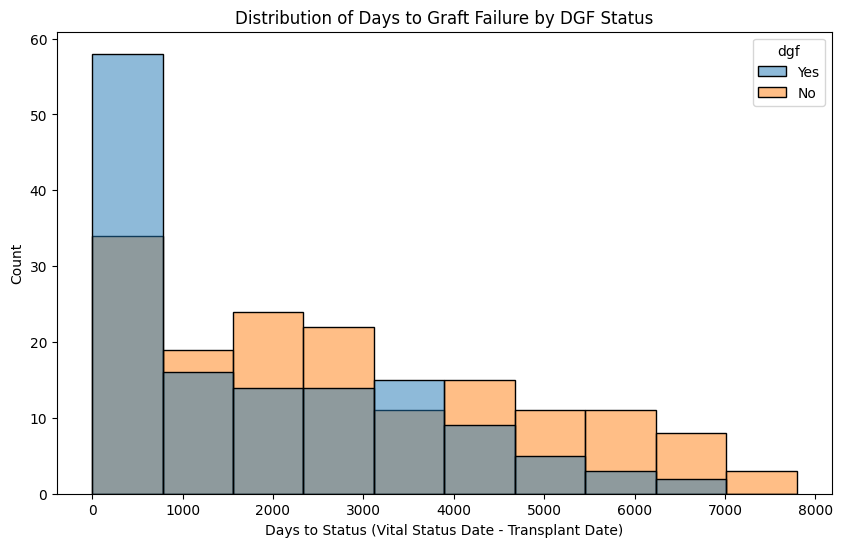

In [171]:
# Convert date columns
df['txdate'] = pd.to_datetime(df['txdate'])
df['statusdt_censored'] = pd.to_datetime(df['statusdt_censored'])

# Calculate the number of days from transplant to status date
df['days_to_status'] = (df['statusdt_censored'] - df['txdate']).dt.days

# Define categories for status
status_categories = df['status'].unique()

# Create separate plots for each status category and compare DGF (Yes/No)
for status in status_categories:
    subset_df = df[df['status'] == status]
    
    plt.figure(figsize=(10, 6))
    sns.histplot(data=subset_df, x='days_to_status', hue='dgf')
    plt.title(f'Distribution of Days to {status} by DGF Status')
    plt.xlabel('Days to Status (Vital Status Date - Transplant Date)')
    plt.ylabel('Count')
    plt.show()

In [173]:
df_grouped = df.groupby(['status'])['days_to_status'].agg(['mean', 'median', 'count']).reset_index()
df_grouped

,status,mean,median,count
0,Alive with a functioning kidney,2762.687269,2333.5,1084
1,Death,2427.275574,2203.0,479
2,Graft Failure,2299.547619,1934.0,294


### Key Insights

- Patients who are alive with a functioning kidney have the longest mean and median days from transplant to status date, indicating better long-term outcomes.
- Patients who have died have shorter mean and median days compared to those alive with a functioning kidney, suggesting worse outcomes.
- Patients with graft failure have the shortest mean and median days, indicating the poorest outcomes among the three groups.

In [172]:
df_grouped = df.groupby(['status', 'dgf'])['days_to_status'].agg(['mean', 'median', 'count']).reset_index()
df_grouped

,status,dgf,mean,median,count
0,Alive with a functioning kidney,No,2736.728246,2308.0,747
1,Alive with a functioning kidney,Yes,2820.228487,2370.0,337
2,Death,No,2564.528428,2481.0,299
3,Death,Yes,2199.283333,1986.5,180
4,Graft Failure,No,2721.196203,2434.0,158
5,Graft Failure,Yes,1809.691176,1335.5,136


#### Key Insights: 

1. **Alive with a Functioning Kidney**:
   - **DGF (Yes)** patients have a slightly higher **mean** and **median** time (2820 days and 2370 days, respectively) compared to **non-DGF (No)** patients (mean: 2736 days, median: 2308 days).
   - This suggests that patients with **DGF** can have longer periods with a functioning kidney post-transplant than those without DGF. 
   - However, it is important to note that the difference is marginal, and **DGF** may not significantly reduce the duration of kidney function in this group.

2. **Death**:
   - For **Death**, the mean and median time to death is shorter for **DGF** patients (mean: 2199 days, median: 1986.5 days) compared to **non-DGF** patients (mean: 2564.5 days, median: 2481 days).
   - This suggests that patients with **DGF** tend to have shorter survival times compared to non-DGF patients. The **median** time for DGF patients is nearly 500 days shorter, indicating a substantial difference in overall survival.

3. **Graft Failure**:
   - **DGF** patients show a significantly shorter time to **graft failure** (mean: 1809.69 days, median: 1335.5 days) compared to **non-DGF** patients (mean: 2721.20 days, median: 2434 days).
   - This suggests that DGF has a notable negative impact on graft survival, with DGF patients experiencing graft failure much earlier than non-DGF patients. The median time to failure is reduced by over 1000 days for DGF patients, which is a significant finding.

#### Conclusions: 
- **DGF appears to reduce overall survival** and significantly shortens the time to **graft failure**, which is a major negative outcome for kidney transplant recipients.
- Interestingly, **DGF patients may still have slightly longer durations of kidney function** compared to non-DGF patients before death, but the difference is small and may not be clinically significant.
- Overall, DGF is associated with worse outcomes in terms of **graft survival** and **time to death**, making it a critical factor in transplant prognosis.



## The Bivariate Analysis between DGF and independent Variables

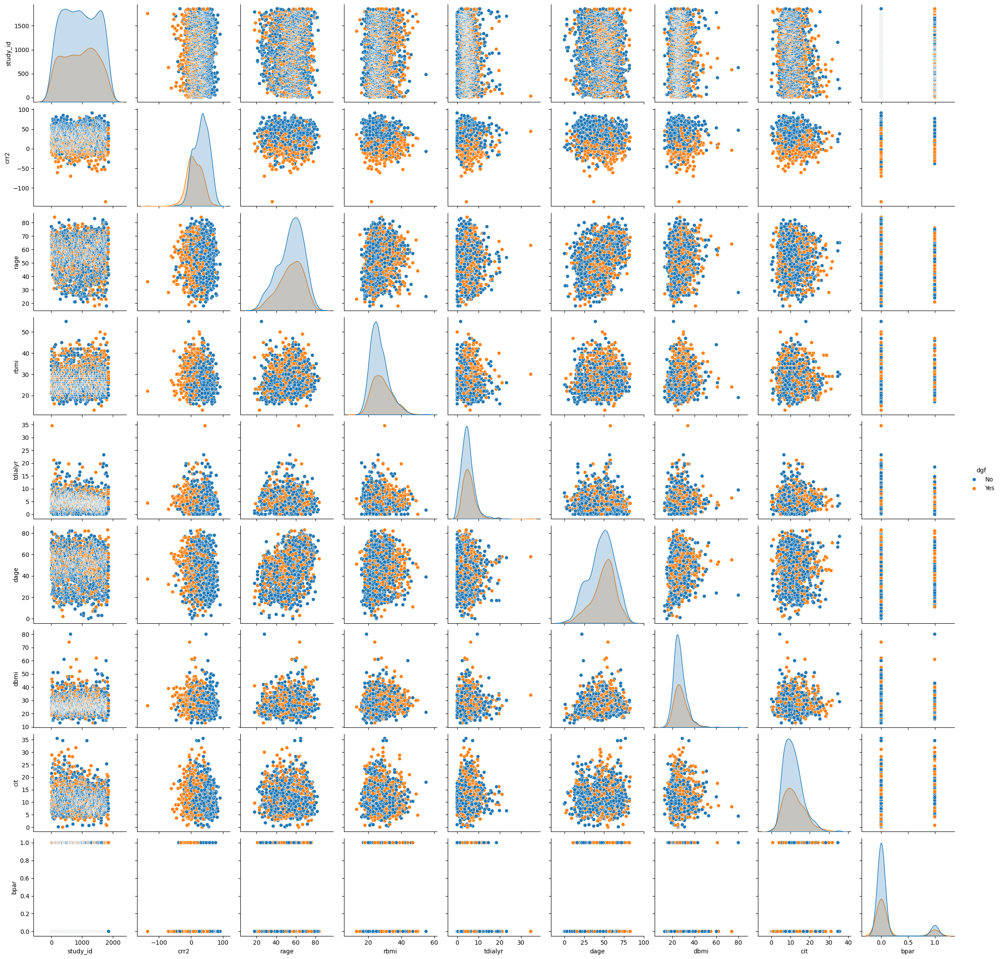

In [4]:
sns.pairplot(df, hue='dgf')

We could see the crr2 allows both yes and no in the DGF column almost perfectly separated

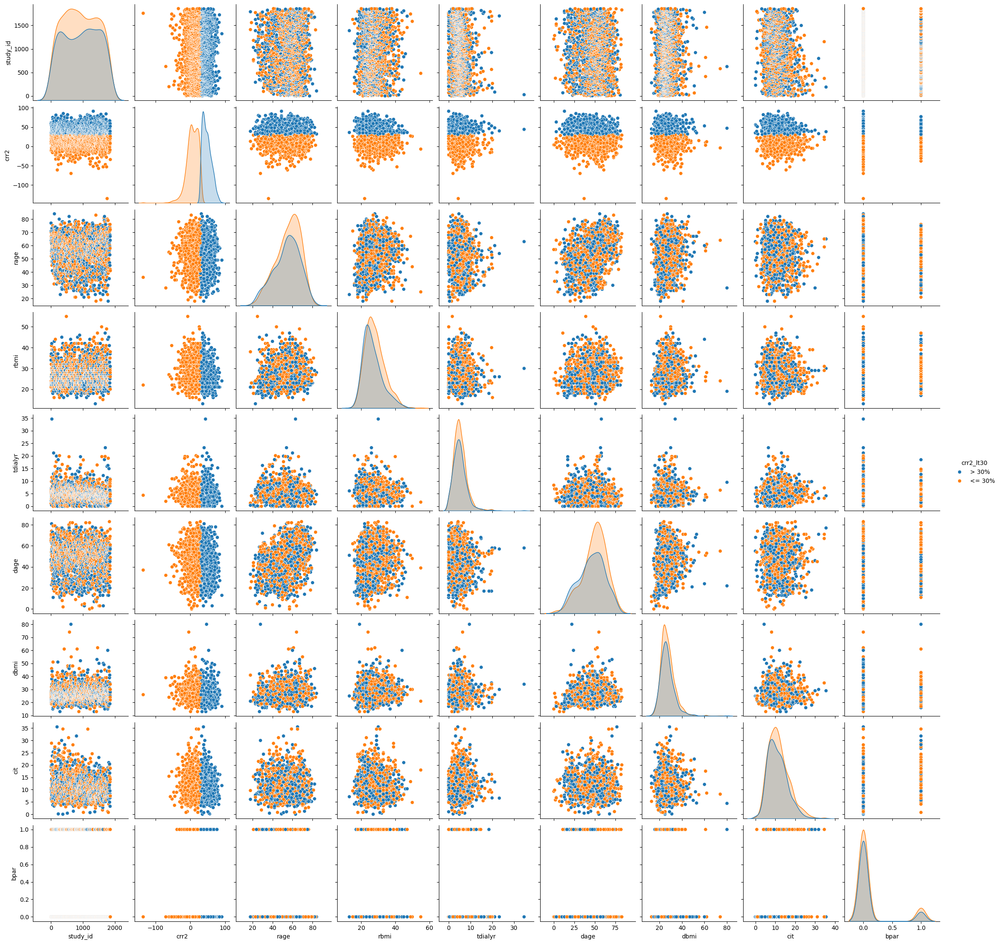

In [5]:
sns.pairplot(df, hue='crr2_lt30')

We could see the column `crr2` separates `crr2_lt30` perfectly

## Data Preparation for Machine Learning Training

**Initially, we should remove the 'study_id' column, as it does not influence DGF. Retaining it could potentially introduce biases.**

In [132]:
df_cleaned = df.drop(columns=['study_id'])

In [133]:
df_cleaned['dtype'].value_counts()

dtype
Deceased    1857
Name: count, dtype: int64

**The dtype column contains a single value, indicating that all donors are deceased. While this information is insightful, it does not contribute to the effectiveness of our machine learning model.**

In [134]:
df_cleaned = df_cleaned.drop(columns=['dtype'])

In [135]:
df_cleaned.columns

Index(['txdate', 'dgf', 'crr2', 'crr2_lt30', 'rage', 'rsex', 'rwhite', 'rbmi',
       'tdialyr', 'pkpracat0', 'num_comorb', 'rhist_dm', 'rhist_chd',
       'rhist_chf', 'rhist_stroke', 'rhist_pvd', 'rhist_cld',
       'rhist_skin_cancer', 'rhist_non_skin_cancer', 'dage', 'dsex', 'dbmi',
       'ddeathcause_cva', 'cit', 'ecd', 'dcd', 'regraft', 'inductype',
       'cni_disch', 'txera', 'statusdt_censored', 'status', 'bpar',
       'first_bpardt', 'first_re_admdt'],
      dtype='object')

### Dropping date columns

In [136]:
df_cleaned.drop(columns=['txdate', 'statusdt_censored', 'first_bpardt', 'first_re_admdt'], inplace=True)

### Dropping unnecessary columns

In [137]:

df_cleaned.drop(columns=['num_comorb', 'cni_disch', 'txera', 'bpar', 'status'], inplace=True)

### **Handling Missing Data**

- **Calculate The percentage of missing data for each variable**

In [138]:
# Calculate the count and percentage of missing values
missing_data = df_cleaned.isnull().sum().to_frame(name='Missing Count')
missing_data['Percentage'] = (df_cleaned.isnull().sum() / len(df_cleaned) * 100).round(2)

In [139]:
missing_data

,Missing Count,Percentage
dgf,0,0.00
crr2,17,0.92
crr2_lt30,17,0.92
rage,0,0.00
rsex,0,0.00
rwhite,429,23.10
rbmi,95,5.12
tdialyr,6,0.32
pkpracat0,213,11.47
rhist_dm,9,0.48


In [140]:
missing_data[missing_data['Missing Count']>0]

,Missing Count,Percentage
crr2,17,0.92
crr2_lt30,17,0.92
rwhite,429,23.10
rbmi,95,5.12
tdialyr,6,0.32
pkpracat0,213,11.47
rhist_dm,9,0.48
rhist_chd,7,0.38
rhist_chf,10,0.54
rhist_stroke,8,0.43


In [141]:
df['first_bpardt'].isna().sum(), len(df[df['bpar']==0])

(np.int64(1641), 1641)

In [142]:
df[df['bpar']==0][['bpar','first_bpardt']].sample(10)

,bpar,first_bpardt
1846,0,NaN
1490,0,NaN
1833,0,NaN
1032,0,NaN
214,0,NaN
442,0,NaN
1574,0,NaN
1312,0,NaN
1770,0,NaN
1515,0,NaN


The `first_bpardt` column, representing the first biopsy-proven acute rejection date (yyyy-mm-dd), has 88.37% missing data. This is because if it is not bpar, then the value of the date is NaN. Thus, we could fill this with 0

However, based on our result, including the column  `days_to_bpar` drop the accuracy, so let's drop it

**Next, we want to analyze whether `first_re_admt` is MCAR or not. However, in order to do MCAR, we need to convert all variables to float**

**For date columns, we convert it to days differences with transplant date**

In [143]:
# df_cleaned['days_to_readmission'] = (pd.to_datetime(df_cleaned['first_re_admdt']) - pd.to_datetime(df_cleaned['txdate'])).dt.days
# df_cleaned['days_to_status'] = (pd.to_datetime(df_cleaned['statusdt_censored']) - pd.to_datetime(df_cleaned['txdate'])).dt.days
# df_cleaned['days_to_bpar'] = (pd.to_datetime(df_cleaned['first_bpardt']) - pd.to_datetime(df_cleaned['txdate'])).dt.days.fillna(0)
# df_cleaned = df_cleaned.drop(columns=['first_re_admdt', 'statusdt_censored', 'txdate', 'first_bpardt'])


**For Categorical variables, we map it to class 1, class 2, and class 3**

In [144]:
# Summary for categorical variables
cat_summary = df_cleaned.describe(include='object')

In [145]:
for col in cat_summary.columns:
    print(f"{col}:", df_cleaned[col].unique())

dgf: ['No' 'Yes']
crr2_lt30: ['> 30%' '<= 30%' nan]
rsex: ['Female' 'Male']
rwhite: ['White' nan 'Non-white']
pkpracat0: ['pkPRA>0%' 'pkPRA=0%' nan]
rhist_dm: ['No' 'Yes' nan]
rhist_chd: ['No' 'Yes' nan]
rhist_chf: ['No' 'Yes' nan]
rhist_stroke: ['No' 'Yes' nan]
rhist_pvd: ['Yes' 'No' nan]
rhist_cld: ['Yes' 'No' nan]
rhist_skin_cancer: ['No' 'Yes' nan]
rhist_non_skin_cancer: ['No' 'Yes' nan]
dsex: ['Female' 'Male' nan]
ddeathcause_cva: ['Others' 'Stroke (CVA)' nan]
ecd: ['ECD' 'Non-ECD']
dcd: ['No' 'Yes']
inductype: ['Depleting agent' 'Non-depleting agent' nan]


In [146]:
# Define mappings for each categorical column based on the provided unique values
mappings = {
    'dgf': {'No': 0, 'Yes': 1},
    'crr2_lt30': {'<= 30%': 0, '> 30%': 1},
    'rsex': {'Male': 0, 'Female': 1},
    'rwhite': {'White': 0, 'Non-white': 1},
    'pkpracat0': {'pkPRA=0%': 0, 'pkPRA>0%': 1},
    'rhist_dm': {'No': 0, 'Yes': 1},
    'rhist_chd': {'No': 0, 'Yes': 1},
    'rhist_chf': {'No': 0, 'Yes': 1},
    'rhist_stroke': {'No': 0, 'Yes': 1},
    'rhist_pvd': {'No': 0, 'Yes': 1},
    'rhist_cld': {'No': 0, 'Yes': 1},
    'rhist_skin_cancer': {'No': 0, 'Yes': 1},
    'rhist_non_skin_cancer': {'No': 0, 'Yes': 1},
    'dsex': {'Male': 0, 'Female': 1},
    'ddeathcause_cva': {'Others': 0, 'Stroke (CVA)': 1},
    'ecd': {'Non-ECD': 0, 'ECD': 1},
    'dcd': {'No': 0, 'Yes': 1},
    'inductype': {'Depleting agent': 0, 'Non-depleting agent': 1},
}

# Apply mappings to the DataFrame
for column, mapping in mappings.items():
    df_cleaned[column] = df_cleaned[column].map(mapping)


In [147]:
df_cleaned.sample(10)

,dgf,crr2,crr2_lt30,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,rhist_dm,...,rhist_non_skin_cancer,dage,dsex,dbmi,ddeathcause_cva,cit,ecd,dcd,regraft,inductype
1758,0,33.0,1.0,59,1,NaN,26.0,5.0,NaN,0.0,...,0.0,64.0,1.0,27.0,1.0,15.0,1,0,0,1.0
384,0,85.0,1.0,58,1,NaN,21.0,2.0,1.0,1.0,...,0.0,27.0,1.0,26.0,0.0,16.0,0,0,0,0.0
97,0,65.0,1.0,55,0,1.0,26.0,5.0,1.0,0.0,...,0.0,51.0,1.0,23.0,0.0,3.0,0,0,0,1.0
1597,0,66.0,1.0,75,0,NaN,18.0,3.0,0.0,0.0,...,0.0,29.0,0.0,23.0,0.0,8.0,0,0,0,1.0
1272,1,52.0,1.0,64,1,1.0,23.0,5.0,0.0,1.0,...,1.0,39.0,0.0,27.0,0.0,6.0,0,1,0,1.0
1620,1,7.0,0.0,48,0,NaN,27.0,2.0,0.0,0.0,...,0.0,26.0,1.0,36.0,0.0,4.0,0,0,0,0.0
1212,0,49.0,1.0,45,0,1.0,28.0,4.0,1.0,1.0,...,0.0,58.0,1.0,28.0,0.0,9.0,0,0,0,0.0
1555,1,-6.0,0.0,63,1,0.0,34.0,7.0,0.0,1.0,...,0.0,37.0,1.0,23.0,0.0,6.0,0,1,0,0.0
225,1,43.0,1.0,35,0,0.0,24.0,9.0,1.0,0.0,...,0.0,47.0,0.0,28.0,0.0,18.0,0,0,1,0.0
1375,1,-11.0,0.0,58,0,1.0,28.0,6.0,1.0,1.0,...,0.0,61.0,0.0,26.0,0.0,13.0,1,1,0,0.0


**Now all categorical variables have become numerical variables**

In [148]:
def little_mcar_test(data, alpha=0.05):
    """
    Performs Little's MCAR (Missing Completely At Random) test on a dataset with missing values.
    
    Parameters:
    data (DataFrame): A pandas DataFrame with n observations and p variables, where some values are missing.
    alpha (float): The significance level for the hypothesis test (default is 0.05).
    
    Returns:
    A tuple containing:
    - A matrix of missing values that represents the pattern of missingness in the dataset.
    - A p-value representing the significance of the MCAR test.
    """
    
    # Calculate the proportion of missing values in each variable
    p_m = data.isnull().mean()
    
    # Calculate the proportion of complete cases for each variable
    p_c = data.dropna().shape[0] / data.shape[0]
    
    # Calculate the correlation matrix for all pairs of variables that have complete cases
    R_c = data.dropna().corr()
    
    # Calculate the correlation matrix for all pairs of variables using all observations
    R_all = data.corr()
    
    # Calculate the difference between the two correlation matrices
    R_diff = R_all - R_c
    
    # Calculate the variance of the R_diff matrix
    V_Rdiff = np.var(R_diff, ddof=1)
    
    # Calculate the expected value of V_Rdiff under the null hypothesis that the missing data is MCAR
    E_Rdiff = (1 - p_c) / (1 - p_m).sum()
    
    # Calculate the test statistic
    T = np.trace(R_diff) / np.sqrt(V_Rdiff * E_Rdiff)
    
    # Calculate the degrees of freedom
    df = data.shape[1] * (data.shape[1] - 1) / 2
    
    # Calculate the p-value using a chi-squared distribution with df degrees of freedom and the test statistic T
    p_value = 1 - chi2.cdf(T ** 2, df)
    
    # Create a matrix of missing values that represents the pattern of missingness in the dataset
    missingness_matrix = data.isnull().astype(int)
    
    # Return the missingness matrix and the p-value
    return missingness_matrix, p_value

In [149]:
missingness_matrix, p_value = little_mcar_test(df_cleaned)

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:4006: FutureWarning: The behavior of DataFrame.var with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return var(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


In [150]:
p_value

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1.])

In hypothesis testing, the **p-value** helps us determine whether to reject the null hypothesis. The null hypothesis (H₀) typically represents a default position or a statement of no effect or no difference.

- **P-value**: The probability of obtaining test results at least as extreme as the observed results, assuming that the null hypothesis is true.

When I performed a test, I compare the p-value to a significance level (α), often set at 0.05.

- **If the p-value is less than α (e.g., 0.05)**: There is strong evidence against the null hypothesis, so I reject it.
- **If the p-value is greater than α**: There is not enough evidence to reject the null hypothesis.

In My case, a p-value of 1.0 means that the observed data is perfectly consistent with the null hypothesis. This indicates that there is no evidence to suggest that the missing data is not Missing Completely At Random (MCAR). Essentially, the data's missingness pattern is random and not related to any other variables in the dataset.

So, a p-value of 1.0 means that the null hypothesis (that the data is MCAR) holds true, and there's no reason to believe otherwise based on thr data.

**Now, we fill the missing rows for categorical variables with Mode**

In [151]:
# Fill missing values with the ratio of unique values of non-missing values
for col in cat_summary.columns:
    if df_cleaned[col].isnull().any():
        value_counts = df_cleaned[col].value_counts(normalize=True)
        random_numbers = np.random.rand(df_cleaned[col].isnull().sum())
        cumulative_distribution = value_counts.cumsum()
        fill_values = [value_counts.index[(cumulative_distribution >= rn).argmax()] for rn in random_numbers]
        df_cleaned.loc[df_cleaned[col].isnull(), col] = fill_values

**And, we fill the missing rows for numerical variables with mean**

In [152]:
# Summary for numerical variables
num_summary = df_cleaned.describe()

num_summary

,dgf,crr2,crr2_lt30,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,rhist_dm,...,rhist_non_skin_cancer,dage,dsex,dbmi,ddeathcause_cva,cit,ecd,dcd,regraft,inductype
count,1857.000000,1840.000000,1857.000000,1857.000000,1857.000000,1857.000000,1762.000000,1851.000000,1857.000000,1857.000000,...,1857.000000,1853.000000,1857.000000,1831.000000,1857.000000,1519.000000,1857.000000,1857.000000,1857.000000,1857.000000
mean,0.351642,24.938587,0.452342,54.867528,0.373183,0.482499,27.293984,5.124257,0.469575,0.343026,...,0.086699,47.777658,0.407647,27.049700,0.218094,11.437788,0.283253,0.227248,0.078621,0.231018
std,0.477612,25.551769,0.497858,12.592832,0.483780,0.499828,5.739851,3.113130,0.499208,0.474848,...,0.281469,15.465114,0.491529,6.215901,0.413063,5.127355,0.450699,0.419167,0.269219,0.421597
min,0.000000,-135.000000,0.000000,18.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,5.000000,0.000000,47.000000,0.000000,0.000000,23.000000,3.000000,0.000000,0.000000,...,0.000000,38.000000,0.000000,23.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,27.000000,0.000000,56.000000,0.000000,0.000000,26.000000,5.000000,0.000000,0.000000,...,0.000000,49.000000,0.000000,26.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,44.000000,1.000000,64.000000,1.000000,1.000000,30.750000,7.000000,1.000000,1.000000,...,0.000000,59.000000,1.000000,30.000000,0.000000,14.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,91.000000,1.000000,84.000000,1.000000,1.000000,55.000000,35.000000,1.000000,1.000000,...,1.000000,83.000000,1.000000,80.000000,1.000000,36.000000,1.000000,1.000000,1.000000,1.000000


In [157]:
df.describe()

,study_id,crr2,rage,rbmi,tdialyr,num_comorb,dage,dbmi,cit,regraft,bpar
count,1857.000000,1840.000000,1857.000000,1762.000000,1851.000000,1857.000000,1853.000000,1831.000000,1519.000000,1857.000000,1857.000000
mean,929.000000,24.938587,54.867528,27.293984,5.124257,0.998923,47.777658,27.049700,11.437788,0.078621,0.116317
std,536.214043,25.551769,12.592832,5.739851,3.113130,1.099078,15.465114,6.215901,5.127355,0.269219,0.320691
min,1.000000,-135.000000,18.000000,13.000000,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000
25%,465.000000,5.000000,47.000000,23.000000,3.000000,0.000000,38.000000,23.000000,8.000000,0.000000,0.000000
50%,929.000000,27.000000,56.000000,26.000000,5.000000,1.000000,49.000000,26.000000,11.000000,0.000000,0.000000
75%,1393.000000,44.000000,64.000000,30.750000,7.000000,2.000000,59.000000,30.000000,14.000000,0.000000,0.000000
max,1857.000000,91.000000,84.000000,55.000000,35.000000,6.000000,83.000000,80.000000,36.000000,1.000000,1.000000


In [153]:
for col in num_summary.columns:
    df_cleaned[col] = df_cleaned[col].fillna(df_cleaned[col].median())

**Note that it is impossible to have `tdialyr` < 0, so we need to remove it**

In [154]:
df_cleaned = df_cleaned[df_cleaned['tdialyr'] >= 0].reset_index(drop=True)
df_cleaned.describe()

,dgf,crr2,crr2_lt30,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,rhist_dm,...,rhist_non_skin_cancer,dage,dsex,dbmi,ddeathcause_cva,cit,ecd,dcd,regraft,inductype
count,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,...,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000
mean,0.351642,24.957458,0.452342,54.867528,0.373183,0.482499,27.227787,5.123856,0.469575,0.343026,...,0.086699,47.780291,0.407647,27.035003,0.218094,11.358104,0.283253,0.227248,0.078621,0.231018
std,0.477612,25.435238,0.497858,12.592832,0.483780,0.499828,5.598291,3.108102,0.499208,0.474848,...,0.281469,15.448544,0.491529,6.173442,0.413063,4.640112,0.450699,0.419167,0.269219,0.421597
min,0.000000,-135.000000,0.000000,18.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,5.000000,0.000000,47.000000,0.000000,0.000000,23.000000,3.000000,0.000000,0.000000,...,0.000000,38.000000,0.000000,23.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,27.000000,0.000000,56.000000,0.000000,0.000000,26.000000,5.000000,0.000000,0.000000,...,0.000000,49.000000,0.000000,26.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,43.000000,1.000000,64.000000,1.000000,1.000000,30.000000,7.000000,1.000000,1.000000,...,0.000000,59.000000,1.000000,30.000000,0.000000,13.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,91.000000,1.000000,84.000000,1.000000,1.000000,55.000000,35.000000,1.000000,1.000000,...,1.000000,83.000000,1.000000,80.000000,1.000000,36.000000,1.000000,1.000000,1.000000,1.000000


## Machine Learning Model Prediction

## Without Crr2

## Data Normalization

In [161]:
X, y_dgf, y_crr2_lt30 = df_cleaned.drop(columns=["crr2_lt30", "dgf", "crr2"]), df_cleaned['dgf'], df_cleaned['crr2_lt30']

In [162]:
X.sample(10)

,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,rhist_dm,rhist_chd,rhist_chf,rhist_stroke,...,rhist_non_skin_cancer,dage,dsex,dbmi,ddeathcause_cva,cit,ecd,dcd,regraft,inductype
168,41,1,1.0,23.0,7.0,1.0,0.0,0.0,0.0,0.0,...,0.0,37.0,0.0,25.0,0.0,11.0,0,0,0,0.0
690,70,0,1.0,33.0,4.0,0.0,1.0,1.0,0.0,0.0,...,0.0,66.0,0.0,27.0,1.0,12.0,1,0,0,0.0
1609,46,1,1.0,21.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,26.0,0.0,24.0,0.0,19.0,0,0,0,1.0
1457,51,1,1.0,29.0,10.0,0.0,0.0,0.0,0.0,0.0,...,0.0,57.0,0.0,23.0,0.0,9.0,0,1,0,0.0
1130,39,0,0.0,26.0,4.0,1.0,0.0,0.0,0.0,0.0,...,0.0,50.0,0.0,29.0,0.0,19.0,0,1,0,0.0
1743,64,0,1.0,24.0,3.0,0.0,1.0,0.0,0.0,0.0,...,0.0,62.0,0.0,23.0,0.0,6.0,1,0,0,0.0
77,49,0,0.0,23.0,13.0,1.0,0.0,0.0,0.0,0.0,...,0.0,19.0,0.0,25.0,0.0,7.0,0,1,1,0.0
867,61,1,0.0,23.0,6.0,1.0,1.0,1.0,0.0,0.0,...,0.0,59.0,1.0,38.0,0.0,8.0,0,0,0,0.0
578,39,0,0.0,21.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,56.0,0.0,22.0,0.0,22.0,0,0,0,1.0
1717,61,1,0.0,26.0,4.0,0.0,0.0,1.0,0.0,0.0,...,0.0,37.0,1.0,24.0,1.0,8.0,0,0,0,0.0


In [163]:
X.describe()

,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,rhist_dm,rhist_chd,rhist_chf,rhist_stroke,...,rhist_non_skin_cancer,dage,dsex,dbmi,ddeathcause_cva,cit,ecd,dcd,regraft,inductype
count,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,...,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000,1857.000000
mean,54.867528,0.373183,0.482499,27.227787,5.123856,0.469575,0.343026,0.262251,0.057081,0.065697,...,0.086699,47.780291,0.407647,27.035003,0.218094,11.358104,0.283253,0.227248,0.078621,0.231018
std,12.592832,0.483780,0.499828,5.598291,3.108102,0.499208,0.474848,0.439977,0.232060,0.247819,...,0.281469,15.448544,0.491529,6.173442,0.413063,4.640112,0.450699,0.419167,0.269219,0.421597
min,18.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.000000,0.000000,0.000000,23.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,38.000000,0.000000,23.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000
50%,56.000000,0.000000,0.000000,26.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,49.000000,0.000000,26.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000
75%,64.000000,1.000000,1.000000,30.000000,7.000000,1.000000,1.000000,1.000000,0.000000,0.000000,...,0.000000,59.000000,1.000000,30.000000,0.000000,13.000000,1.000000,0.000000,0.000000,0.000000
max,84.000000,1.000000,1.000000,55.000000,35.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,83.000000,1.000000,80.000000,1.000000,36.000000,1.000000,1.000000,1.000000,1.000000


In [164]:
X.columns

Index(['rage', 'rsex', 'rwhite', 'rbmi', 'tdialyr', 'pkpracat0', 'rhist_dm',
       'rhist_chd', 'rhist_chf', 'rhist_stroke', 'rhist_pvd', 'rhist_cld',
       'rhist_skin_cancer', 'rhist_non_skin_cancer', 'dage', 'dsex', 'dbmi',
       'ddeathcause_cva', 'cit', 'ecd', 'dcd', 'regraft', 'inductype'],
      dtype='object')

These variables would likely benefit from normalization if their distributions are skewed or if they have different ranges to avoid certain features dominating the model.

### Variables to Normalize
- **Highly Disparate Ranges**:
  - `age`: ranges from 18 to 84.
  - `rbmi` (BMI): ranges from 13 to 55.
  - `tdialyr` (Dialysis years): ranges from 0 to 34.58
  - `dage` and `dbmi` (Donor age and BMI): both seem to have wide ranges.
These numerical variables should be normalized using StandardScaler.

### Why normalize these variables?
- **Age, BMI, and dialysis years**: While their distributions may be fairly normal, normalization ensures consistent treatment across models.

This normalization ensures that all features contribute equally and consistently to the model training process.

In [165]:
normalized_vars = ['rage', 'rbmi', 'tdialyr', 'dage', 'dbmi', 'cit']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the numerical columns
X[normalized_vars] = scaler.fit_transform(X[normalized_vars])

### General Function to Calculate the Model Accuracy

In [166]:
model_df = {}

def model_evaluation(model, X, y):
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Fitting the model
    model.fit(X_train, y_train)

    # Predicting the test set
    y_pred = model.predict(X_test)

    # Predict probabilities for AUC score
    y_prob = model.predict_proba(X_test)[:, 1]  # Assuming binary classification

    # Calculating accuracy
    accuracy = accuracy_score(y_test, y_pred)
    
    # Calculating AUC score
    auc = roc_auc_score(y_test, y_prob)

    # Calculating F1 scores for both classes
    f1_class1 = f1_score(y_test, y_pred, pos_label=1)  # For Class 1
    f1_class2 = f1_score(y_test, y_pred, pos_label=0)  # For Class 2

    # Cross-validation score
    cross_val_avg = np.mean(cross_val_score(model, X, y, cv=5))

    # Printing out the results
    print(f"Model: {model}")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"AUC: {auc:.4f}")
    print(f"F1 Score (Class 1): {f1_class1:.4f}")
    print(f"F1 Score (Class 2): {f1_class2:.4f}")
    print(f"Average Cross-validation Score: {cross_val_avg:.4f}")

    # Storing the cross-validation score in a dictionary
    model_df[model] = {
        'Accuracy': round(accuracy, 4),
        'AUC': round(auc, 4),
        'F1 Score Class 1': round(f1_class1, 4),
        'F1 Score Class 2': round(f1_class2, 4),
        'Cross-validation Score': round(cross_val_avg, 4)
    }


## GridSearchCV for Random Forest

In [167]:
# Random states, criterion, n_estimators, max_depth to search
param_grid = {
    'random_state': [32, 100, 777, 2022, 8888],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'n_estimators': [8, 16, 50, 100, 150, 200],
    'max_depth': [2, 4, 8, 16, 32]
}

def run_grid_search(X, y):
    # Set up the Random Forest Classifier and GridSearchCV
    rf = RandomForestClassifier()
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1, return_train_score=True)
    
    # Splitting the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    grid_search.fit(X_train, y_train)
    
    # Access all the results
    results = pd.DataFrame(grid_search.cv_results_)
    
    # Sort the models by test AUC score
    results = results.sort_values(by='mean_test_score', ascending=False)
    
    # Get top N models by AUC score
    top_models = results
    
    top_models_metrics = []
    
    for i, row in top_models.iterrows():
        params = {key: row['param_' + key] for key in param_grid}
        #print(f"Parameters for model {i+1}: {params}")
        
        # Re-train the model with the top parameters
        model = RandomForestClassifier(**params)
        model.fit(X_train, y_train)
        
        # Predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Metrics calculation
        metrics = {
            'AUC_train': round(roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]), 4),
            'AUC_test': round(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]), 4),
            'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
            'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
            'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
            'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
            'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
            'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4),
            'params': params,
        }
        
        top_models_metrics.append(metrics)
    
    return pd.DataFrame(top_models_metrics), model, X_train, X_test, y_train, y_test

## Predicting DGF

In [174]:
all_metrics, best_model, X_train, X_test, y_train, y_test = run_grid_search(X, y_dgf)

In [168]:
# X_train, X_test, y_train, y_test = train_test_split(X, y_crr2_lt30, test_size=0.2, random_state=42)

In [172]:
# X_train, X_test, y_train, y_test = train_test_split(X, y_dgf, test_size=0.2, random_state=42)

In [169]:
# X_train.to_csv('X_train_without_crr2.csv',index=False)
# X_test.to_csv('X_test_without_crr2.csv',index=False)
# y_train.to_csv('y_dgf_train_without_crr2.csv',index=False)
# y_test.to_csv('y_dgf_test_without_crr2.csv',index=False)

In [175]:
first_all_metrics = all_metrics
first_best_model = best_model

In [176]:
best_auc_test = all_metrics.sort_values(by=['AUC_test'], ascending=False).reset_index(drop=True)

In [177]:
# Set the option to display the entire DataFrame
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
best_auc_test.head(10)

,AUC_train,AUC_test,Accuracy_train,Accuracy_test,F1_Class1_train,F1_Class1_test,F1_Class0_train,F1_Class0_test,params
0,0.7915,0.7165,0.6923,0.6828,0.2593,0.1571,0.8058,0.8046,"{'random_state': 32, 'criterion': 'log_loss', ..."
1,0.7915,0.7165,0.6923,0.6828,0.2593,0.1571,0.8058,0.8046,"{'random_state': 32, 'criterion': 'entropy', '..."
2,0.7236,0.7152,0.6458,0.6586,0.0000,0.0000,0.7848,0.7942,"{'random_state': 32, 'criterion': 'log_loss', ..."
3,0.7236,0.7152,0.6458,0.6586,0.0000,0.0000,0.7848,0.7942,"{'random_state': 32, 'criterion': 'entropy', '..."
4,0.9488,0.7147,0.8357,0.7016,0.7024,0.4064,0.8865,0.8007,"{'random_state': 777, 'criterion': 'gini', 'n_..."
5,0.9450,0.7123,0.8155,0.7097,0.6575,0.4000,0.8737,0.8085,"{'random_state': 8888, 'criterion': 'entropy',..."
6,0.9450,0.7123,0.8155,0.7097,0.6575,0.4000,0.8737,0.8085,"{'random_state': 8888, 'criterion': 'log_loss'..."
7,0.7891,0.7122,0.6869,0.6801,0.2414,0.1678,0.8027,0.8020,"{'random_state': 8888, 'criterion': 'log_loss'..."
8,0.7891,0.7122,0.6869,0.6801,0.2414,0.1678,0.8027,0.8020,"{'random_state': 8888, 'criterion': 'entropy',..."
9,0.7891,0.7115,0.6976,0.6774,0.2884,0.2000,0.8080,0.7980,"{'random_state': 8888, 'criterion': 'gini', 'n..."


In [179]:
best_auc_test.loc[1]['params']

{'random_state': 32,
 'criterion': 'entropy',
 'n_estimators': 50,
 'max_depth': 4}

In [180]:
best_model = RandomForestClassifier(**best_auc_test.loc[1]['params'])
best_model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=4, n_estimators=50,
                       random_state=32)

In [181]:
# SHAP analysis
def shap_analysis(model, X_train, X_test):
    explainer = shap.TreeExplainer(model)
    
    # Calculate SHAP values for test set
    shap_values = explainer.shap_values(X_test)
    
    # Summary plot
    shap.summary_plot(shap_values[:,:,1], X_test)

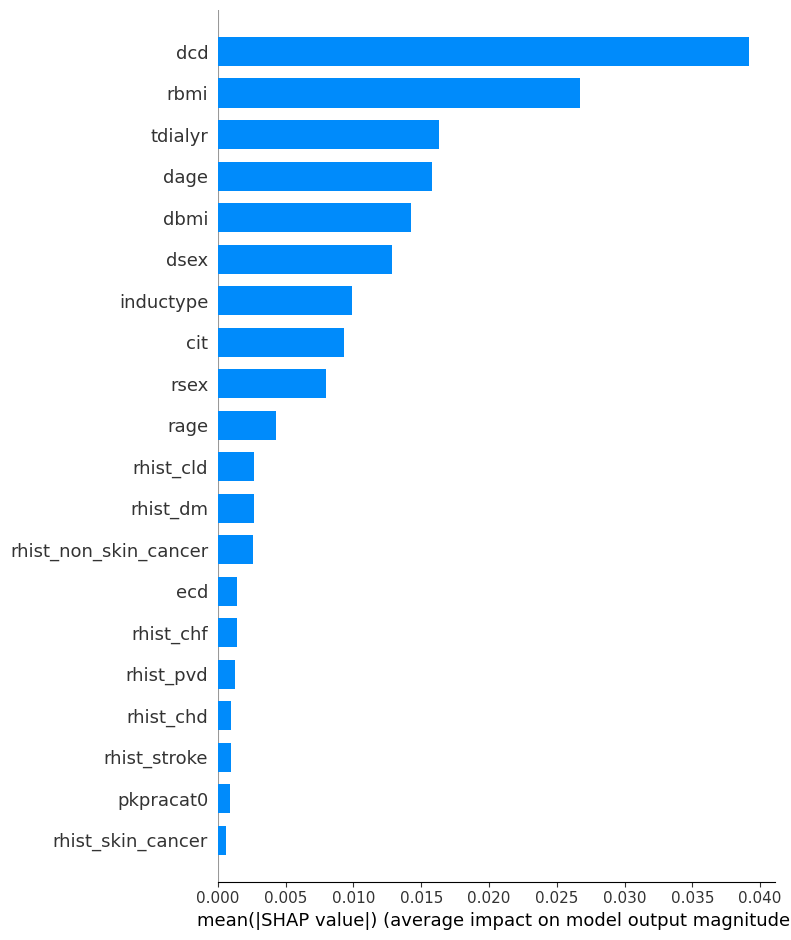

In [182]:
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for test set
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values[:,:,1], X_test, plot_type='bar')


In [183]:
# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer(X_test)

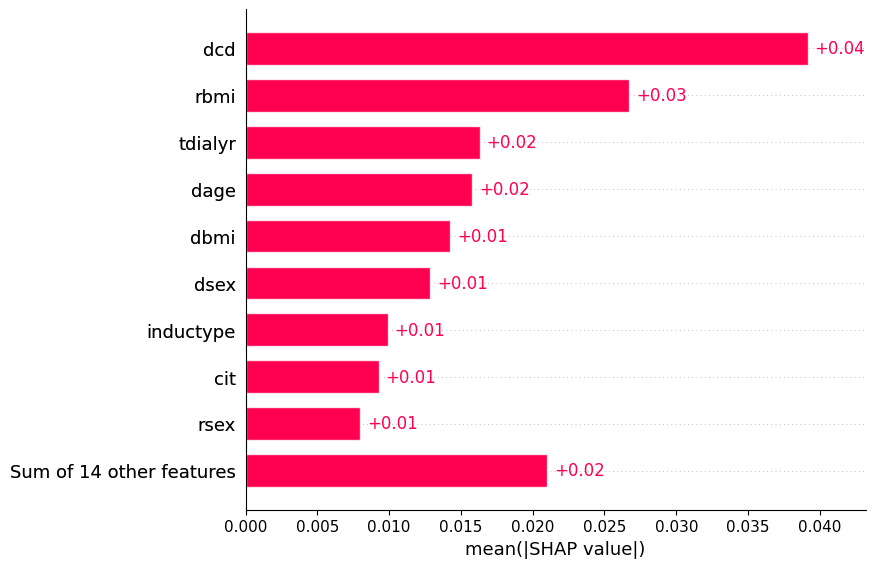

In [184]:
shap.plots.bar(shap_values[:,:,0])

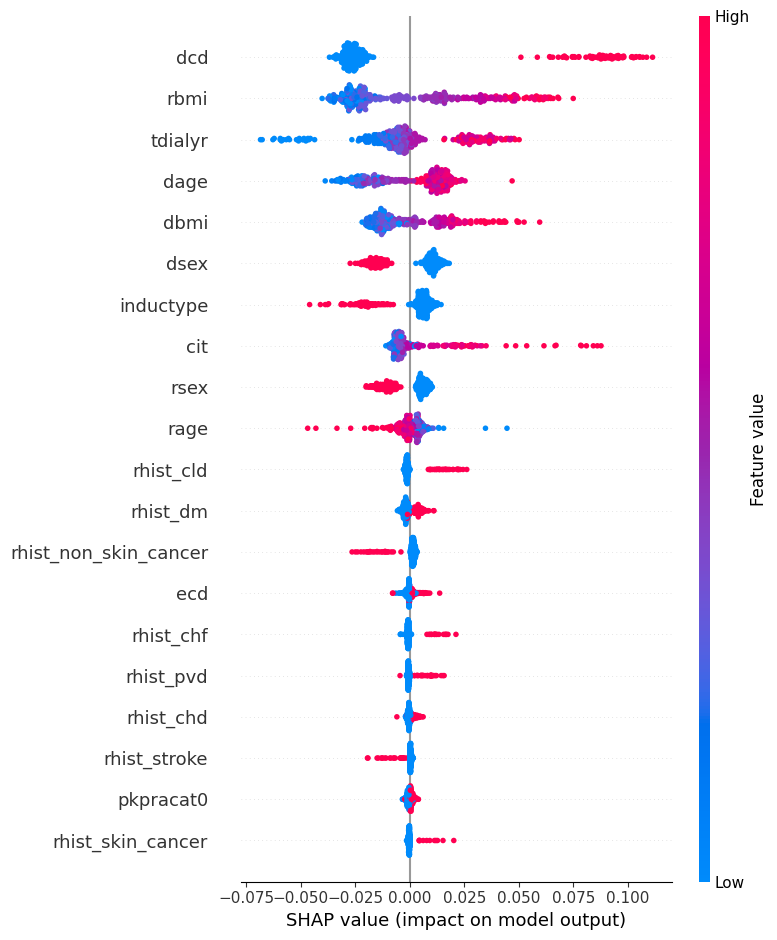

In [185]:
 shap_analysis(best_model, X_train, X_test)

In [186]:
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for test set
shap_values = explainer.shap_values(X_test)

# Force plot for a single prediction (e.g., the first instance in the test set)
shap.initjs()
shap.plots.force(explainer.expected_value[0], shap_values[:,:,0], X_test.columns)

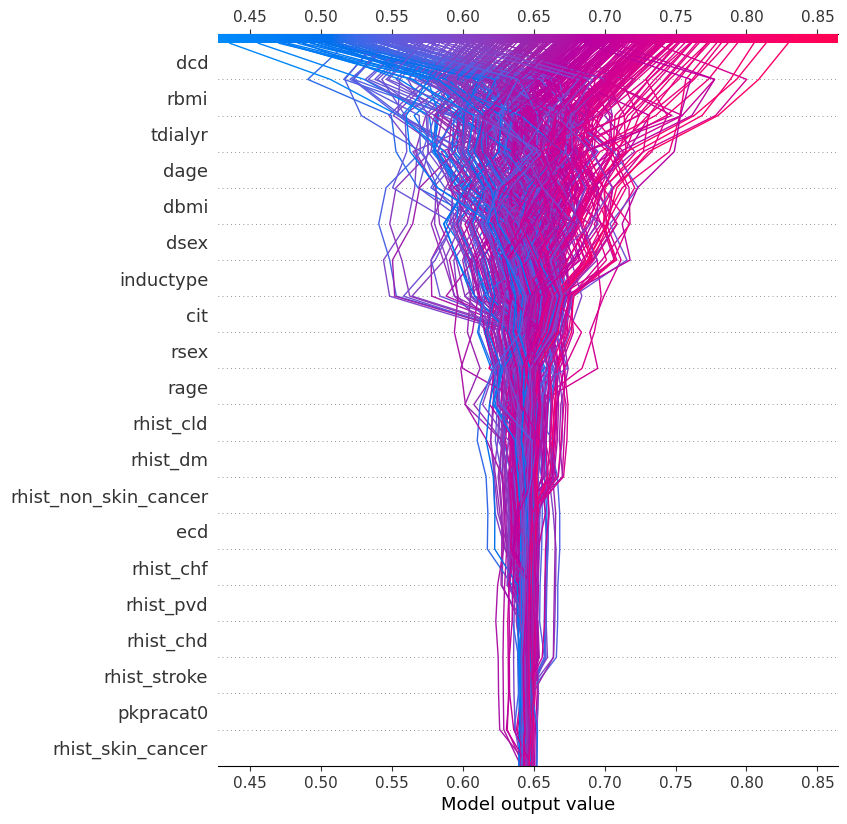

In [187]:
# Force plot for a single prediction (e.g., the first instance in the test set)
shap.initjs()
shap.plots.decision(explainer.expected_value[0], shap_values[:,:,0], X_test)

## GridSearchCV for Support Vector Machine

In [188]:
# from sklearn.model_selection import GridSearchCV, train_test_split
# from sklearn.svm import SVC
# from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
# import pandas as pd

# # Define the parameter grid for SVM
# param_grid = {
#     'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
#     'C': [0.1, 1, 10, 100, 1000],
#     'gamma': ['scale', 'auto', 0.001, 0.01, 0.1, 1, 10],
#     'random_state': [32, 100, 777, 2022, 8888]  # Note: 'random_state' only applies for specific kernels
# }

# def run_grid_search_svm(X, y):
#     # Set up the Support Vector Classifier and GridSearchCV
#     svm = SVC(probability=True)  # Set `probability=True` to allow for AUC scoring
#     grid_search = GridSearchCV(estimator=svm, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1, return_train_score=True)
    
#     # Split the data
#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#     grid_search.fit(X_train, y_train)
    
#     # Access all the results
#     results = pd.DataFrame(grid_search.cv_results_)
    
#     # Sort the models by test AUC score
#     results = results.sort_values(by='mean_test_score', ascending=False)
    
#     # Get top N models by test accuracy score
#     top_models = results
    
#     top_models_metrics = []
    
#     for i, row in top_models.iterrows():
#         params = {key: row['param_' + key] for key in param_grid}
        
#         # Re-train the model with the top parameters
#         model = SVC(**params, probability=True)
#         model.fit(X_train, y_train)
        
#         # Predictions
#         y_train_pred = model.predict(X_train)
#         y_test_pred = model.predict(X_test)
        
#         # Metrics calculation
#         metrics = {
#             'AUC_train': round(roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]), 4),
#             'AUC_test': round(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]), 4),
#             'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
#             'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
#             'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
#             'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
#             'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
#             'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4),
#             'params': params,
#         }
        
#         top_models_metrics.append(metrics)
    
#     return pd.DataFrame(top_models_metrics), model, X_train, X_test, y_train, y_test


In [32]:
all_metrics, best_model, X_train, X_test, y_train, y_test = run_grid_search_svm(X, y_dgf)

KeyboardInterrupt: 

In [ ]:
best_auc_test = all_metrics.sort_values(by=['AUC_test'], ascending=False).reset_index(drop=True)

In [ ]:
# Set the option to display the entire DataFrame
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
best_auc_test.head(10)

In [ ]:
best_auc_test.loc[1]['params']

## GridSearchCV for Logistic Regression

## Predicting Crr2_lt30

In [189]:
all_metrics, best_model, X_train, X_test, y_train, y_test = run_grid_search(X, y_crr2_lt30)

In [190]:
second_all_metrics = all_metrics
second_best_model = best_model

In [191]:
best_auc_test = all_metrics.sort_values(by=['AUC_test'], ascending=False).reset_index(drop=True)

In [192]:
best_auc_test.head(10)

,AUC_train,AUC_test,Accuracy_train,Accuracy_test,F1_Class1_train,F1_Class1_test,F1_Class0_train,F1_Class0_test,params
0,0.6637,0.7109,0.5751,0.5941,0.1879,0.2488,0.7123,0.7219,"{'random_state': 8888, 'criterion': 'gini', 'n..."
1,0.6633,0.7104,0.5737,0.5887,0.1769,0.2312,0.7124,0.7193,"{'random_state': 8888, 'criterion': 'entropy',..."
2,0.6633,0.7104,0.5737,0.5887,0.1769,0.2312,0.7124,0.7193,"{'random_state': 8888, 'criterion': 'log_loss'..."
3,0.7330,0.7075,0.6465,0.6129,0.4692,0.4098,0.7350,0.7120,"{'random_state': 777, 'criterion': 'gini', 'n_..."
4,0.6636,0.7074,0.5697,0.5753,0.1469,0.1856,0.7123,0.7127,"{'random_state': 100, 'criterion': 'entropy', ..."
5,0.6636,0.7074,0.5697,0.5753,0.1469,0.1856,0.7123,0.7127,"{'random_state': 100, 'criterion': 'log_loss',..."
6,0.6635,0.7069,0.5690,0.5780,0.1557,0.2030,0.7107,0.7130,"{'random_state': 100, 'criterion': 'gini', 'n_..."
7,0.6642,0.7067,0.5731,0.5995,0.1830,0.2587,0.7110,0.7256,"{'random_state': 32, 'criterion': 'log_loss', ..."
8,0.6642,0.7067,0.5731,0.5995,0.1830,0.2587,0.7110,0.7256,"{'random_state': 32, 'criterion': 'entropy', '..."
9,0.6645,0.7062,0.5744,0.5860,0.1877,0.2300,0.7117,0.7169,"{'random_state': 8888, 'criterion': 'gini', 'n..."


In [193]:
best_auc_test.loc[1]['params']

{'random_state': 8888,
 'criterion': 'entropy',
 'n_estimators': 100,
 'max_depth': 2}

In [194]:
best_model = RandomForestClassifier(**best_auc_test.loc[1]['params'])
best_model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=2, random_state=8888)

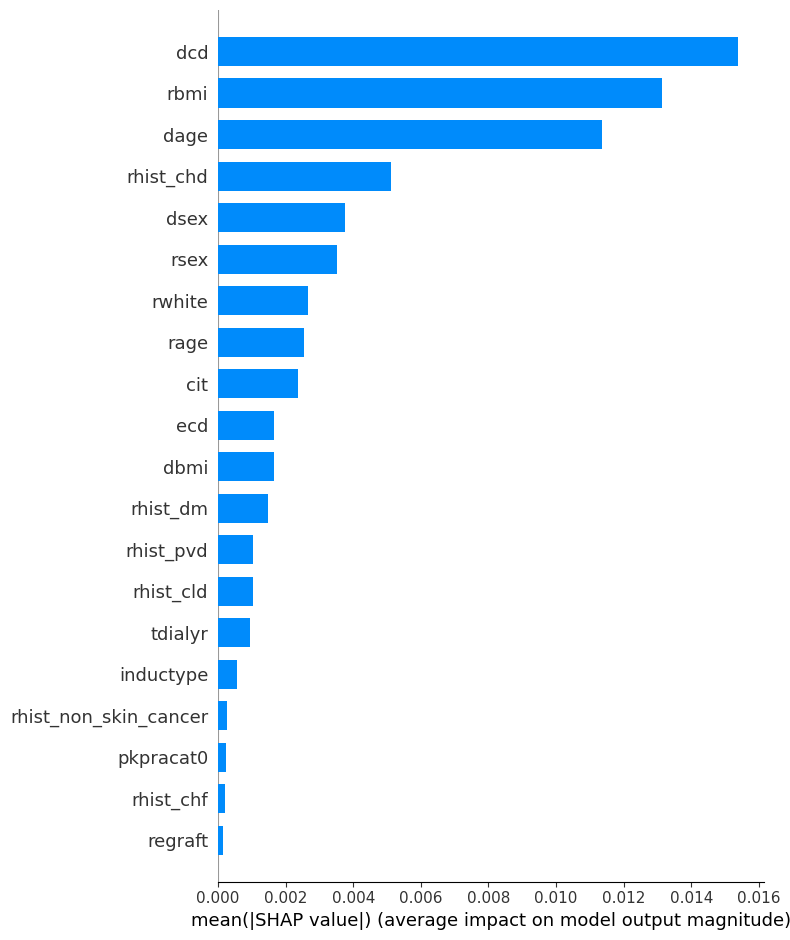

In [195]:
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for test set
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values[:,:,1], X_test, plot_type='bar')

In [196]:
# SHAP analysis
def shap_analysis(model, X_train, X_test):
    explainer = shap.TreeExplainer(model)
    
    # Calculate SHAP values for test set
    shap_values = explainer.shap_values(X_test)
    
    # Summary plot
    shap.summary_plot(shap_values[:,:,0], X_test)

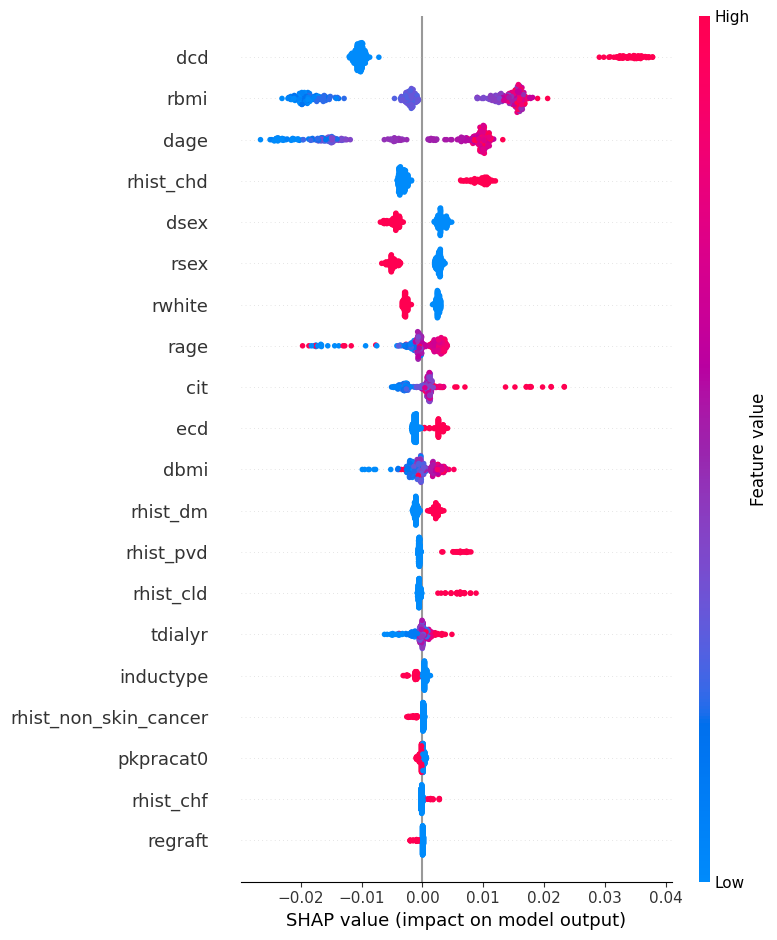

In [197]:
shap_analysis(best_model, X_train, X_test)

In [198]:
# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer(X_test)

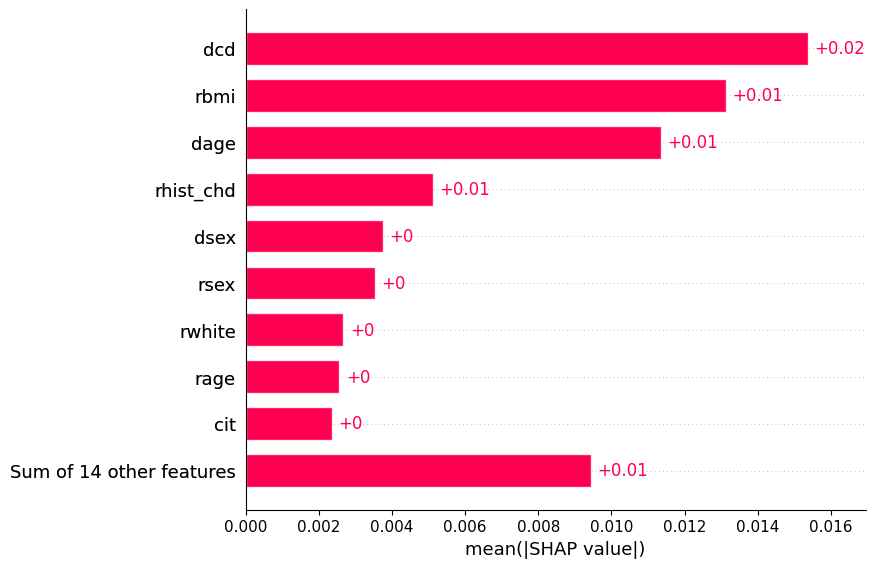

In [199]:

shap.plots.bar(shap_values[:,:,0])

In [200]:
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for test set
shap_values = explainer.shap_values(X_test)

# Force plot for a single prediction (e.g., the first instance in the test set)
shap.initjs()
shap.plots.force(explainer.expected_value[0], shap_values[:,:,0], X_test.columns)

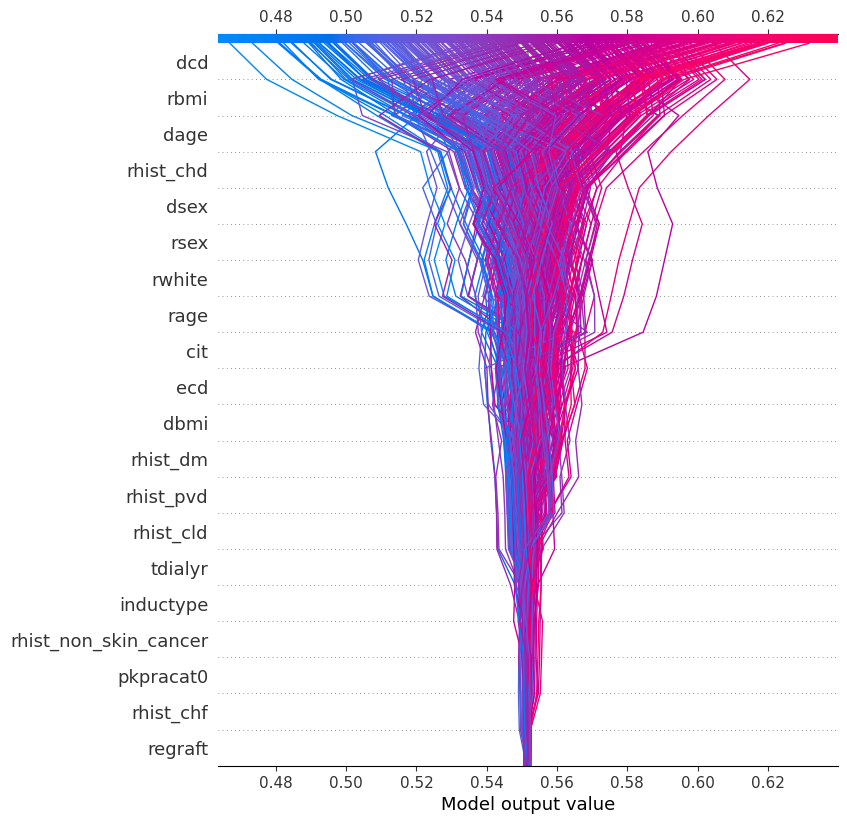

In [201]:
# Force plot for a single prediction (e.g., the first instance in the test set)
shap.initjs()
shap.plots.decision(explainer.expected_value[0], shap_values[:,:,0], X_test)

## With Crr2

In [35]:
X, y_dgf, y_crr2_lt30 = df_cleaned.drop(columns=["crr2_lt30", "dgf"]), df_cleaned['dgf'], df_cleaned['crr2_lt30']

In [36]:
X.sample(10)

,crr2,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,dage,dbmi,cit,inductype,cni_disch,txera,status,bpar,days_to_readmission,days_to_status
72,30.000000,55,0,0.0,29.0,6.03,0.0,48.0,21.0,10.820000,1.0,0.0,0,0,0,86.000000,4143
1088,-11.000000,58,1,1.0,31.0,7.14,0.0,57.0,25.0,4.630000,0.0,0.0,1,0,1,396.000000,3292
208,28.000000,55,0,0.0,24.0,6.40,1.0,24.0,23.0,11.447472,0.0,0.0,2,1,0,20.000000,913
1742,18.000000,64,0,0.0,24.0,2.88,0.0,62.0,23.0,6.170000,0.0,0.0,2,2,0,0.000000,47
186,57.000000,54,1,0.0,23.0,2.40,0.0,35.0,26.0,10.500000,0.0,0.0,2,1,0,421.968254,1827
501,24.901523,65,0,1.0,25.0,3.04,0.0,16.0,21.0,21.620000,0.0,1.0,0,2,0,15.000000,4236
200,34.000000,55,0,1.0,31.0,4.25,1.0,73.0,22.0,5.220000,0.0,0.0,1,2,0,524.000000,2742
719,-15.000000,66,1,0.0,34.0,11.25,1.0,58.0,22.0,11.000000,1.0,0.0,2,2,0,421.968254,655
510,-24.000000,56,1,0.0,29.0,3.49,0.0,53.0,24.0,4.420000,0.0,0.0,2,1,0,421.968254,585
261,1.000000,33,0,0.0,31.0,6.86,1.0,61.0,27.0,11.447472,0.0,1.0,0,1,0,421.968254,7157


In [37]:
X.describe()

,crr2,rage,rsex,rwhite,rbmi,tdialyr,pkpracat0,dage,dbmi,cit,inductype,cni_disch,txera,status,bpar,days_to_readmission,days_to_status
count,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000,1856.000000
mean,24.904703,54.873922,0.373384,0.378233,27.296836,5.118905,0.412716,47.784004,27.055114,11.444954,0.222522,0.126078,1.188039,0.899784,0.116379,419.942375,2604.244612
std,25.483025,12.593210,0.483833,0.485077,5.591179,3.074666,0.492455,15.450183,6.169459,4.624046,0.416052,0.332026,0.808104,0.637279,0.320766,565.880978,1830.555607
min,-135.000000,18.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,13.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,47.000000,0.000000,0.000000,23.000000,3.170000,0.000000,38.000000,23.000000,8.365000,0.000000,0.000000,0.750000,0.000000,0.000000,56.000000,1194.000000
50%,26.000000,56.000000,0.000000,0.000000,27.000000,4.790000,0.000000,49.000000,26.000000,11.447472,0.000000,0.000000,1.000000,1.000000,0.000000,421.968254,2260.000000
75%,43.250000,64.000000,1.000000,1.000000,30.000000,6.600000,1.000000,59.000000,30.000000,13.350000,0.000000,0.000000,2.000000,1.000000,0.000000,421.968254,3619.250000
max,91.000000,84.000000,1.000000,1.000000,55.000000,34.580000,1.000000,83.000000,80.000000,35.520000,1.000000,1.000000,2.000000,2.000000,1.000000,4885.000000,8692.000000


### Normalize the Data

In [38]:
normalized_vars = ['crr2','rage', 'rbmi', 'tdialyr', 'dage', 'dbmi', 'cit', 'days_to_readmission', 'days_to_status']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the numerical columns
X[normalized_vars] = scaler.fit_transform(X[normalized_vars])

## Predicting DGF

## GridSearchCV for Random Forest

In [231]:
all_metrics, best_model, X_train, X_test, y_train, y_test = run_grid_search(X, y_dgf)

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y_dgf, test_size=0.2, random_state=42)

In [41]:
X_train.to_csv('X_train_with_crr2.csv',index=False)
X_test.to_csv('X_test_with_crr2.csv',index=False)
y_train.to_csv('y_dgf_train_with_crr2.csv',index=False)
y_test.to_csv('y_dgf_test_with_crr2.csv',index=False)

In [232]:
third_all_metrics = all_metrics
third_best_model = best_model

In [233]:
best_auc_test = all_metrics.sort_values(by=['AUC_test'], ascending=False).reset_index(drop=True)

In [234]:
best_auc_test.head(10)

,AUC_train,AUC_test,Accuracy_train,Accuracy_test,F1_Class1_train,F1_Class1_test,F1_Class0_train,F1_Class0_test,params
0,0.7774,0.7656,0.6496,0.6774,0.0406,0.0323,0.7857,0.8065,"{'random_state': 8888, 'criterion': 'log_loss'..."
1,0.7774,0.7656,0.6496,0.6774,0.0406,0.0323,0.7857,0.8065,"{'random_state': 8888, 'criterion': 'entropy',..."
2,0.9643,0.7650,0.8747,0.7231,0.7929,0.4663,0.9101,0.8131,"{'random_state': 8888, 'criterion': 'log_loss'..."
3,0.9643,0.7650,0.8747,0.7231,0.7929,0.4663,0.9101,0.8131,"{'random_state': 8888, 'criterion': 'entropy',..."
4,0.9646,0.7642,0.8747,0.7258,0.7924,0.4742,0.9102,0.8145,"{'random_state': 8888, 'criterion': 'entropy',..."
5,0.9646,0.7642,0.8747,0.7258,0.7924,0.4742,0.9102,0.8145,"{'random_state': 8888, 'criterion': 'log_loss'..."
6,0.9634,0.7640,0.8747,0.7231,0.7924,0.4718,0.9102,0.8124,"{'random_state': 8888, 'criterion': 'entropy',..."
7,0.9634,0.7640,0.8747,0.7231,0.7924,0.4718,0.9102,0.8124,"{'random_state': 8888, 'criterion': 'log_loss'..."
8,0.8287,0.7628,0.7520,0.6989,0.5093,0.3333,0.8341,0.8056,"{'random_state': 2022, 'criterion': 'log_loss'..."
9,0.8287,0.7628,0.7520,0.6989,0.5093,0.3333,0.8341,0.8056,"{'random_state': 2022, 'criterion': 'entropy',..."


In [235]:
best_auc_test = all_metrics.sort_values(by=['AUC_test'], ascending=False).reset_index(drop=True)

In [236]:
best_model = RandomForestClassifier(**best_auc_test.loc[1]['params'])
best_model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=2, n_estimators=16,
                       random_state=8888)

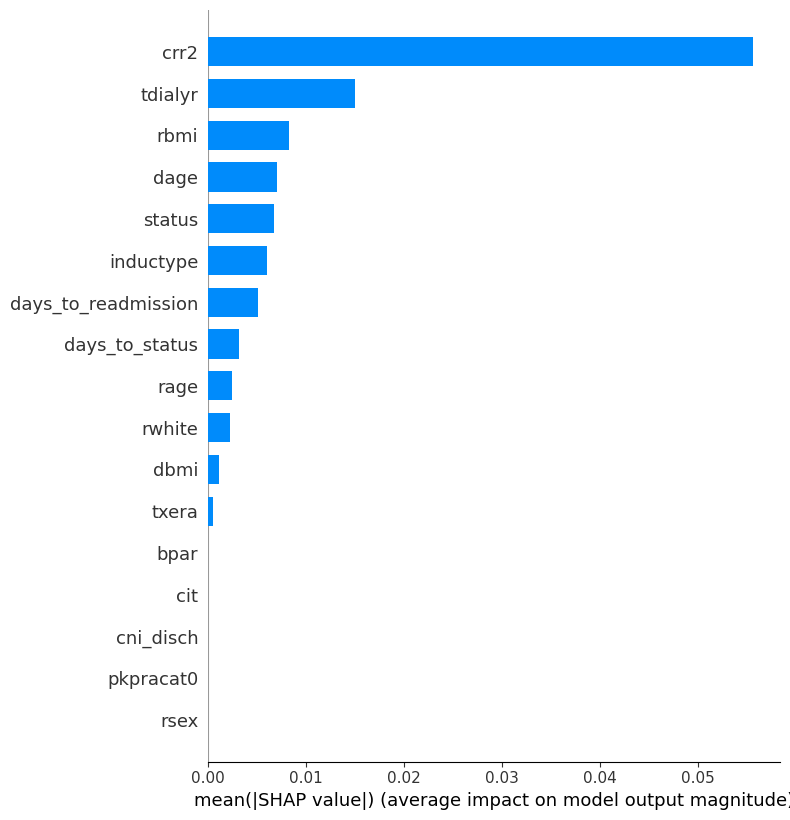

In [237]:
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for test set
shap_values = explainer.shap_values(X_test)

shap.summary_plot(shap_values[:,:,1], X_test, plot_type='bar')

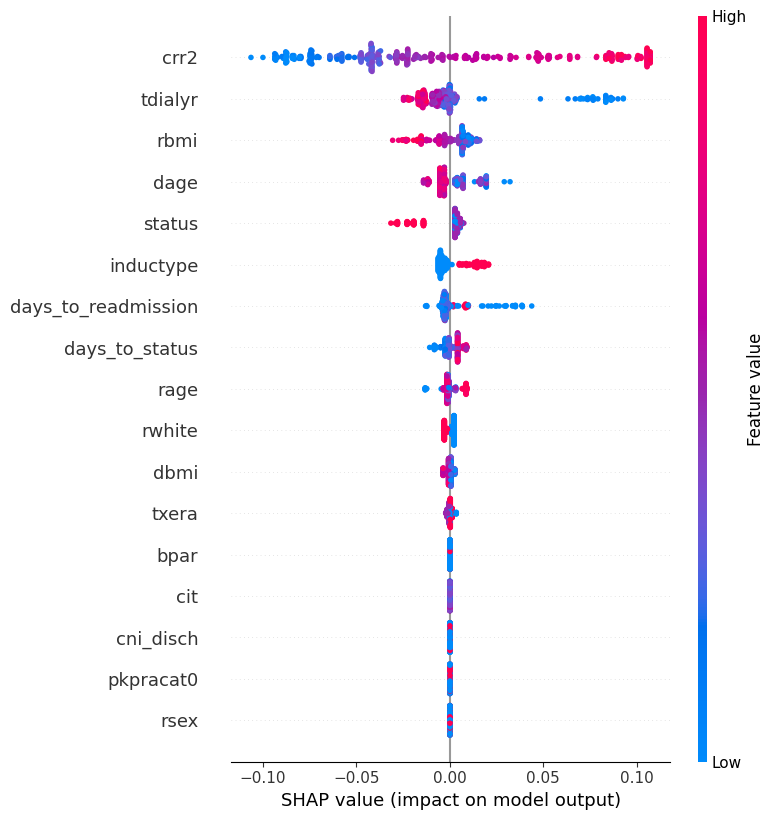

In [238]:
shap_analysis(best_model, X_train, X_test)

In [239]:
# Create SHAP explainer
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values
shap_values = explainer(X_test)

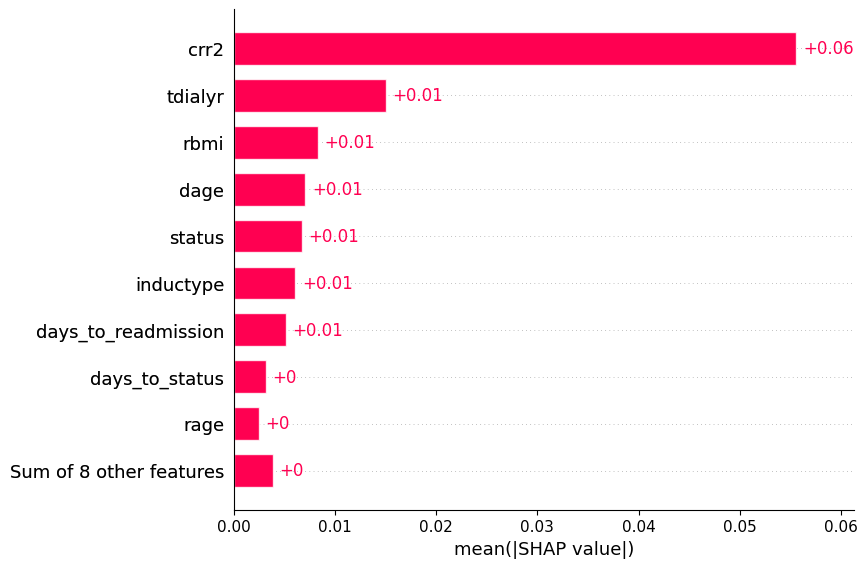

In [240]:
shap.plots.bar(shap_values[:,:,0])

In [241]:
explainer = shap.TreeExplainer(best_model)

# Calculate SHAP values for test set
shap_values = explainer.shap_values(X_test)

# Force plot for a single prediction (e.g., the first instance in the test set)
shap.initjs()
shap.plots.force(explainer.expected_value[0], shap_values[:,:,0], X_test.columns)

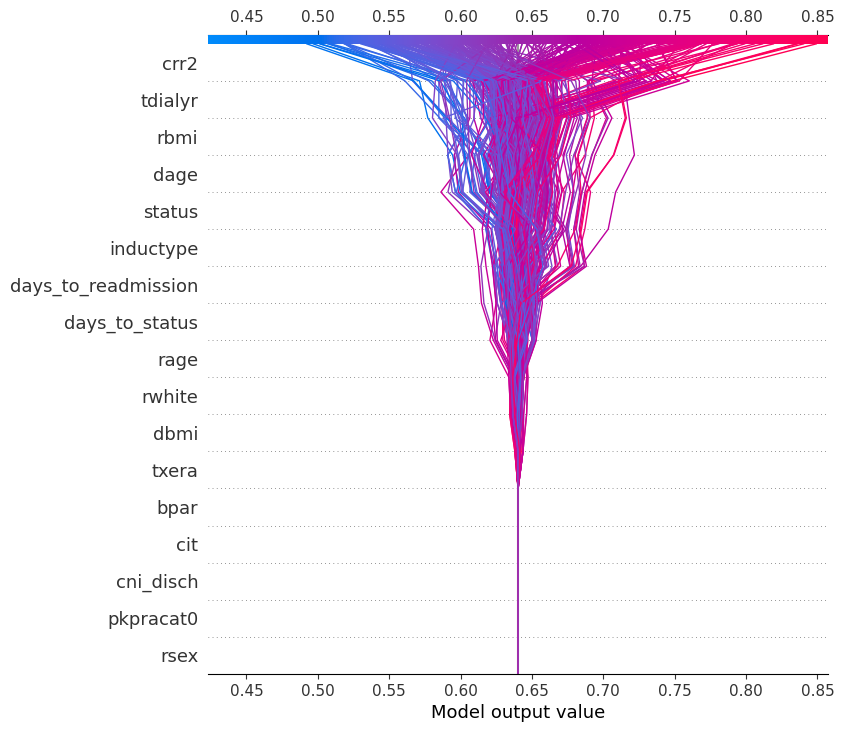

In [242]:
# Force plot for a single prediction (e.g., the first instance in the test set)
shap.initjs()
shap.plots.decision(explainer.expected_value[0], shap_values[:,:,0], X_test)

## Ablation Analysis

## Without Crr2

### Predicting DGF

In [39]:
model_evaluation(RandomForestClassifier(random_state=42), X, y_dgf)

Model: RandomForestClassifier(random_state=42)
Accuracy: 0.6371
AUC: 0.5517
F1 Score (Class 1): 0.2703
F1 Score (Class 2): 0.7585
Average Cross-validation Score: 0.6498


### Predicting crr2_lt30

In [40]:
model_evaluation(RandomForestClassifier(random_state=42), X, y_crr2_lt30)

Model: RandomForestClassifier(random_state=42)
Accuracy: 0.5887
AUC: 0.5997
F1 Score (Class 1): 0.4742
F1 Score (Class 2): 0.6623
Average Cross-validation Score: 0.5787


In [28]:

# Random states, criterion, n_estimators, max_depth to search
param_grid = {
    'random_state': [32, 100, 777, 2022, 8888],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'n_estimators': [8, 16, 50, 100, 150, 200],
    'max_depth': [2, 4, 8, 16, 32]
}

def run_grid_search(X, y):
    rf = RandomForestClassifier()
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)
    
    # Splitting the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    grid_search.fit(X_train, y_train)
    
    # Best parameters from grid search
    print(f"Best parameters: {grid_search.best_params_}")
    best_rf = grid_search.best_estimator_

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)
    
    # Metrics calculation and rounding
    metrics = {
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }
    
    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)
    
    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test

    return metrics


## Predicting DGF Withour Crr2

In [49]:
run_grid_search(X,y_dgf)

Best parameters: {'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 50, 'random_state': 2022}


{'AUC_train': np.float64(0.9596101517064755),
 'AUC_test': np.float64(0.5875081967213114),
 'Accuracy_train': 0.818733153638814,
 'Accuracy_test': 0.696236559139785,
 'F1_Class1_train': np.float64(0.6624843161856964),
 'F1_Class1_test': np.float64(0.25165562913907286),
 'F1_Class2_train': np.float64(0.8760939659143252),
 'F1_Class2_test': np.float64(0.8094435075885329),
 'Cross_Val_Score': np.float64(0.6731959231959233)}

## Rounded Prediction of DGF without crr2

In [79]:
run_grid_search(X,y_dgf)

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters: {'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 50, 'random_state': 2022}


{'AUC_train': np.float64(0.9596),
 'AUC_test': np.float64(0.5875),
 'Accuracy_train': 0.8187,
 'Accuracy_test': 0.6962,
 'F1_Class1_train': np.float64(0.6625),
 'F1_Class1_test': np.float64(0.2517),
 'F1_Class0_train': np.float64(0.8761),
 'F1_Class0_test': np.float64(0.8094),
 'Cross_Val_Score_train': np.float64(0.6732),
 'Cross_Val_Score_test': np.float64(0.6587)}

## Accuracy-Based Prediction

In [29]:
# Random states, criterion, n_estimators, max_depth to search
param_grid = {
    'random_state': [32, 100, 777, 2022, 8888],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'n_estimators': [8, 16, 50, 100, 150, 200],
    'max_depth': [2, 4, 8, 16, 32]
}

def run_grid_search(X, y, rank=1):
    rf = RandomForestClassifier()
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)
    
    # Splitting the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    grid_search.fit(X_train, y_train)
    
    # Access all the results
    results = grid_search.cv_results_
    sorted_indices = np.argsort(results['rank_test_score'])
    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    print(f"Parameters for {rank} best model: {best_params}")
    
    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)
    
    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)
    
    # Metrics calculation and rounding
    metrics = {
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }
    
    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)
    
    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test

    return metrics



## 2nd Best Metrics

In [94]:
# running for 2nd and 3rd best models on dataset
metrics_2nd_best = run_grid_search(X, y_dgf, rank=2)

Parameters for 2 best model: {'random_state': np.int64(2022), 'criterion': 'log_loss', 'n_estimators': np.int64(50), 'max_depth': np.int64(8)}


In [95]:
metrics_2nd_best

{'AUC_train': np.float64(0.9596),
 'AUC_test': np.float64(0.5875),
 'Accuracy_train': 0.8187,
 'Accuracy_test': 0.6962,
 'F1_Class1_train': np.float64(0.6625),
 'F1_Class1_test': np.float64(0.2517),
 'F1_Class0_train': np.float64(0.8761),
 'F1_Class0_test': np.float64(0.8094),
 'Cross_Val_Score_train': np.float64(0.6732),
 'Cross_Val_Score_test': np.float64(0.6587)}

## 3rd Best Metrics

In [96]:
metrics_3rd_best = run_grid_search(X, y_dgf, rank=3)

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Parameters for 3 best model: {'random_state': np.int64(8888), 'criterion': 'log_loss', 'n_estimators': np.int64(100), 'max_depth': np.int64(8)}


In [97]:
metrics_3rd_best

{'AUC_train': np.float64(0.9628),
 'AUC_test': np.float64(0.5931),
 'Accuracy_train': 0.8208,
 'Accuracy_test': 0.6909,
 'F1_Class1_train': np.float64(0.6667),
 'F1_Class1_test': np.float64(0.2581),
 'F1_Class0_train': np.float64(0.8774),
 'F1_Class0_test': np.float64(0.8048),
 'Cross_Val_Score_train': np.float64(0.6718),
 'Cross_Val_Score_test': np.float64(0.6613)}

## 4th Best Metrics

In [98]:
metrics_4th_best = run_grid_search(X, y_dgf, rank=4)

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Parameters for 4 best model: {'random_state': np.int64(8888), 'criterion': 'entropy', 'n_estimators': np.int64(100), 'max_depth': np.int64(8)}


In [100]:
metrics_4th_best

{'AUC_train': np.float64(0.9628),
 'AUC_test': np.float64(0.5931),
 'Accuracy_train': 0.8208,
 'Accuracy_test': 0.6909,
 'F1_Class1_train': np.float64(0.6667),
 'F1_Class1_test': np.float64(0.2581),
 'F1_Class0_train': np.float64(0.8774),
 'F1_Class0_test': np.float64(0.8048),
 'Cross_Val_Score_train': np.float64(0.6718),
 'Cross_Val_Score_test': np.float64(0.6613)}

## Top 10 Models of Predicting DGF Without CRR2

In [102]:
rank=10

In [ ]:
rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y_dgf, test_size=0.2, random_state=42)
grid_search.fit(X_train, y_train)

# Access all the results
results = grid_search.cv_results_
sorted_indices = np.argsort(results['rank_test_score'])

# Get the rank-th best model
best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
best_params = {key: results['param_' + key][best_index] for key in param_grid}
print(f"Parameters for {rank} best model: {best_params}")

# Use the rank-th best model's parameters
best_rf = RandomForestClassifier(**best_params)
best_rf.fit(X_train, y_train)

# Predictions
y_train_pred = best_rf.predict(X_train)
y_test_pred = best_rf.predict(X_test)

# Metrics calculation and rounding
metrics = {
    'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
    'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
    'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
    'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
    'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
    'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
    'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
    'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
}

# Cross-validation scores
cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

metrics['Cross_Val_Score_train'] = cross_val_train
metrics['Cross_Val_Score_test'] = cross_val_test

In [121]:
for rank in range(1,10):    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    print(f"Parameters for {rank} best model: {best_params}")

    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)

    # Metrics calculation and rounding
    metrics = {
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }

    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test
    pprint.pprint(metrics)

Parameters for 1 best model: {'random_state': np.int64(2022), 'criterion': 'entropy', 'n_estimators': np.int64(50), 'max_depth': np.int64(8)}
{'AUC_test': np.float64(0.5875),
 'AUC_train': np.float64(0.9596),
 'Accuracy_test': 0.6962,
 'Accuracy_train': 0.8187,
 'Cross_Val_Score_test': np.float64(0.6587),
 'Cross_Val_Score_train': np.float64(0.6732),
 'F1_Class0_test': np.float64(0.8094),
 'F1_Class0_train': np.float64(0.8761),
 'F1_Class1_test': np.float64(0.2517),
 'F1_Class1_train': np.float64(0.6625)}
Parameters for 2 best model: {'random_state': np.int64(2022), 'criterion': 'log_loss', 'n_estimators': np.int64(50), 'max_depth': np.int64(8)}


{'AUC_test': np.float64(0.5875),
 'AUC_train': np.float64(0.9596),
 'Accuracy_test': 0.6962,
 'Accuracy_train': 0.8187,
 'Cross_Val_Score_test': np.float64(0.6587),
 'Cross_Val_Score_train': np.float64(0.6732),
 'F1_Class0_test': np.float64(0.8094),
 'F1_Class0_train': np.float64(0.8761),
 'F1_Class1_test': np.float64(0.2517),
 'F1_Class1_train': np.float64(0.6625)}
Parameters for 3 best model: {'random_state': np.int64(8888), 'criterion': 'log_loss', 'n_estimators': np.int64(100), 'max_depth': np.int64(8)}
{'AUC_test': np.float64(0.5931),
 'AUC_train': np.float64(0.9628),
 'Accuracy_test': 0.6909,
 'Accuracy_train': 0.8208,
 'Cross_Val_Score_test': np.float64(0.6613),
 'Cross_Val_Score_train': np.float64(0.6718),
 'F1_Class0_test': np.float64(0.8048),
 'F1_Class0_train': np.float64(0.8774),
 'F1_Class1_test': np.float64(0.2581),
 'F1_Class1_train': np.float64(0.6667)}
Parameters for 4 best model: {'random_state': np.int64(8888), 'criterion': 'entropy', 'n_estimators': np.int64(100), '

Here's the data in a Markdown table format:

### Model Performance Metrics

| Metric                | Model 1 | Model 2 | Model 3 | Model 4 | Model 5 | Model 6 | Model 7 | Model 8 | Model 9 |
|-----------------------|---------|---------|---------|---------|---------|---------|---------|---------|---------|
| AUC Test              | 0.5875  | 0.5875  | 0.5931  | 0.5931  | 0.5995  | 0.5995  | 0.5996  | 0.5996  | 0.5791  |
| AUC Train             | 0.9596  | 0.9596  | 0.9628  | 0.9628  | 0.967   | 0.967   | 0.958   | 0.958   | 0.9758  |
| Accuracy Test         | 0.6962  | 0.6962  | 0.6909  | 0.6909  | 0.6801  | 0.6801  | 0.6801  | 0.6801  | 0.6801  |
| Accuracy Train        | 0.8187  | 0.8187  | 0.8208  | 0.8208  | 0.8241  | 0.8241  | 0.8275  | 0.8275  | 0.8443  |
| Cross Val Score Test  | 0.6587  | 0.6587  | 0.6613  | 0.6613  | 0.6774  | 0.6774  | 0.6639  | 0.6639  | 0.6587  |
| Cross Val Score Train | 0.6732  | 0.6732  | 0.6718  | 0.6718  | 0.6712  | 0.6712  | 0.6705  | 0.6705  | 0.6698  |
| F1 Class 0 Test       | 0.8094  | 0.8094  | 0.8048  | 0.8048  | 0.7973  | 0.7973  | 0.7959  | 0.7959  | 0.798   |
| F1 Class 0 Train      | 0.8761  | 0.8761  | 0.8774  | 0.8774  | 0.8791  | 0.8791  | 0.881   | 0.881   | 0.8916  |
| F1 Class 1 Test       | 0.2517  | 0.2517  | 0.2581  | 0.2581  | 0.242   | 0.242   | 0.2609  | 0.2609  | 0.2323  |
| F1 Class 1 Train      | 0.6625  | 0.6625  | 0.6667  | 0.6667  | 0.6774  | 0.6774  | 0.6863  | 0.6863  | 0.724   |

### Model Parameters

| Parameter    | Model 1       | Model 2       | Model 3       | Model 4       | Model 5       | Model 6       | Model 7       | Model 8       | Model 9       |
|--------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|
| Random State | 2022          | 2022          | 8888          | 8888          | 777           | 777           | 777           | 777           | 32            |
| Criterion    | entropy       | log_loss      | log_loss      | entropy       | entropy       | log_loss      | entropy       | log_loss      | gini          |
| n_estimators | 50            | 50            | 100           | 100           | 100           | 100           | 50            | 50            | 200           |
| max_depth    | 8             | 8             | 8             | 8             | 8             | 8             | 8             | 8             | 8             |



### Top 50 Models

In [49]:
results_df = pd.DataFrame(results).sort_values(by='mean_test_score', ascending=False).reset_index(drop=True)

In [50]:
wanted_col = [col for col in results_df.columns if col.startswith("param_")] + ['mean_test_score', 'rank_test_score']

In [51]:
results_df.head(50)[wanted_col]

,param_criterion,param_max_depth,param_n_estimators,param_random_state,mean_test_score,rank_test_score
0,log_loss,8,50,2022,0.673196,1
1,entropy,8,50,2022,0.673196,1
2,entropy,8,100,8888,0.671840,3
3,log_loss,8,100,8888,0.671840,3
4,log_loss,8,100,777,0.671162,5
5,entropy,8,100,777,0.671162,5
6,entropy,8,50,777,0.670486,7
7,log_loss,8,50,777,0.670486,7
8,gini,8,200,32,0.669815,9
9,log_loss,8,100,2022,0.669151,10


In [41]:
# Initialize an empty list to store the metrics for each model
metrics_list = []

for rank in range(1, 50):    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    #print(f"Parameters for {rank} best model: {best_params}")

    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)

    # Metrics calculation and rounding
    metrics = {
        'Model': rank,
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }

    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test
    
    # Append the metrics to the list
    metrics_list.append(metrics)

# Create DataFrame
metrics_df = pd.DataFrame(metrics_list)

In [45]:
metrics_rf_dgf_without_crr = metrics_df.sort_values(by=['AUC_test'], ascending=False).reset_index(drop=True)

In [46]:
metrics_rf_dgf_without_crr

,Model,AUC_train,AUC_test,Accuracy_train,Accuracy_test,F1_Class1_train,F1_Class1_test,F1_Class0_train,F1_Class0_test,Cross_Val_Score_train,Cross_Val_Score_test
0,31,0.9231,0.6062,0.7925,0.6882,0.6071,0.2840,0.8590,0.8007,0.6671,0.6534
1,32,0.9231,0.6062,0.7925,0.6882,0.6071,0.2840,0.8590,0.8007,0.6671,0.6534
2,49,0.7584,0.6035,0.6995,0.6989,0.3160,0.2113,0.8074,0.8140,0.6651,0.6507
3,42,0.9679,0.6032,0.8228,0.6828,0.6733,0.2532,0.8784,0.7986,0.6658,0.6667
4,43,0.9679,0.6032,0.8228,0.6828,0.6733,0.2532,0.8784,0.7986,0.6658,0.6667
5,13,0.9669,0.6002,0.8187,0.6909,0.6616,0.2767,0.8762,0.8034,0.6685,0.6560
6,12,0.9669,0.6002,0.8187,0.6909,0.6616,0.2767,0.8762,0.8034,0.6685,0.6560
7,34,0.9656,0.5999,0.8160,0.6747,0.6557,0.2390,0.8745,0.7932,0.6665,0.6639
8,35,0.9656,0.5999,0.8160,0.6747,0.6557,0.2390,0.8745,0.7932,0.6665,0.6639
9,7,0.9580,0.5996,0.8275,0.6801,0.6863,0.2609,0.8810,0.7959,0.6705,0.6639


In [54]:
results_df.loc[31,]['params']

{'criterion': 'entropy',
 'max_depth': 8,
 'n_estimators': 150,
 'random_state': 100}

In [55]:
sorted_indices[31]

np.int64(366)

In [101]:
# Random states, criterion, n_estimators, max_depth to search
param_grid = {
    'random_state': [32, 100, 777, 2022, 8888],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'n_estimators': [8, 16, 50, 100, 150, 200],
    'max_depth': [2, 4, 8, 16, 32]
}

def run_grid_search(X, y):
    # Set up the Random Forest Classifier and GridSearchCV
    rf = RandomForestClassifier()
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='roc_auc', cv=5, n_jobs=-1, return_train_score=True)
    
    # Splitting the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    grid_search.fit(X_train, y_train)
    
    # Access all the results
    results = pd.DataFrame(grid_search.cv_results_)
    
    # Sort the models by test AUC score
    results = results.sort_values(by='mean_test_score', ascending=False)
    
    # Get top N models by AUC score
    top_models = results
    
    top_models_metrics = []
    
    for i, row in top_models.iterrows():
        params = {key: row['param_' + key] for key in param_grid}
        #print(f"Parameters for model {i+1}: {params}")
        
        # Re-train the model with the top parameters
        model = RandomForestClassifier(**params)
        model.fit(X_train, y_train)
        
        # Predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)
        
        # Metrics calculation
        metrics = {
            'model_rank': i + 1,
            'AUC_train': round(roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]), 4),
            'AUC_test': round(roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]), 4),
            'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
            'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
            'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
            'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
            'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
            'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4),
            'params': params
        }
        
        top_models_metrics.append(metrics)
    
    return pd.DataFrame(top_models_metrics), model, X_train, X_test, y_train, y_test

In [50]:
run_grid_search(X,y_crr2_lt30)

Best parameters: {'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 100, 'random_state': 8888}


{'AUC_train': np.float64(0.9523124112988142),
 'AUC_test': np.float64(0.628767942583732),
 'Accuracy_train': 0.8679245283018868,
 'Accuracy_test': 0.6102150537634409,
 'F1_Class1_train': np.float64(0.8473520249221184),
 'F1_Class1_test': np.float64(0.5017182130584192),
 'F1_Class2_train': np.float64(0.8836104513064132),
 'F1_Class2_test': np.float64(0.6799116997792495),
 'Cross_Val_Score': np.float64(0.5909545909545909)}

In [80]:
run_grid_search(X,y_crr2_lt30)

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters: {'criterion': 'entropy', 'max_depth': 8, 'n_estimators': 100, 'random_state': 8888}


{'AUC_train': np.float64(0.9523),
 'AUC_test': np.float64(0.6288),
 'Accuracy_train': 0.8679,
 'Accuracy_test': 0.6102,
 'F1_Class1_train': np.float64(0.8474),
 'F1_Class1_test': np.float64(0.5017),
 'F1_Class0_train': np.float64(0.8836),
 'F1_Class0_test': np.float64(0.6799),
 'Cross_Val_Score_train': np.float64(0.591),
 'Cross_Val_Score_test': np.float64(0.5831)}

In [137]:
rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y_crr2_lt30, test_size=0.2, random_state=42)
grid_search.fit(X_train, y_train)

# Access all the results
results = grid_search.cv_results_
sorted_indices = np.argsort(results['rank_test_score'])

# Get the rank-th best model
best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
best_params = {key: results['param_' + key][best_index] for key in param_grid}
print(f"Parameters for {rank} best model: {best_params}")

# Use the rank-th best model's parameters
best_rf = RandomForestClassifier(**best_params)
best_rf.fit(X_train, y_train)

# Predictions
y_train_pred = best_rf.predict(X_train)
y_test_pred = best_rf.predict(X_test)

# Metrics calculation and rounding
metrics = {
    'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
    'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
    'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
    'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
    'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
    'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
    'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
    'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
}

# Cross-validation scores
cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

metrics['Cross_Val_Score_train'] = cross_val_train
metrics['Cross_Val_Score_test'] = cross_val_test

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Parameters for 49 best model: {'random_state': np.int64(8888), 'criterion': 'gini', 'n_estimators': np.int64(100), 'max_depth': np.int64(4)}


In [138]:
for rank in range(1,10):    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    print(f"Parameters for {rank} best model: {best_params}")

    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)

    # Metrics calculation and rounding
    metrics = {
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }

    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test
    pprint.pprint(metrics)

Parameters for 1 best model: {'random_state': np.int64(8888), 'criterion': 'log_loss', 'n_estimators': np.int64(100), 'max_depth': np.int64(8)}
{'AUC_test': np.float64(0.6288),
 'AUC_train': np.float64(0.9523),
 'Accuracy_test': 0.6102,
 'Accuracy_train': 0.8679,
 'Cross_Val_Score_test': np.float64(0.5831),
 'Cross_Val_Score_train': np.float64(0.591),
 'F1_Class0_test': np.float64(0.6799),
 'F1_Class0_train': np.float64(0.8836),
 'F1_Class1_test': np.float64(0.5017),
 'F1_Class1_train': np.float64(0.8474)}
Parameters for 2 best model: {'random_state': np.int64(8888), 'criterion': 'entropy', 'n_estimators': np.int64(100), 'max_depth': np.int64(8)}
{'AUC_test': np.float64(0.6288),
 'AUC_train': np.float64(0.9523),
 'Accuracy_test': 0.6102,
 'Accuracy_train': 0.8679,
 'Cross_Val_Score_test': np.float64(0.5831),
 'Cross_Val_Score_train': np.float64(0.591),
 'F1_Class0_test': np.float64(0.6799),
 'F1_Class0_train': np.float64(0.8836),
 'F1_Class1_test': np.float64(0.5017),
 'F1_Class1_train

### Model Performance Metrics

| Metric                | Model 1 | Model 2 | Model 3 | Model 4 | Model 5 | Model 6 | Model 7 | Model 8 | Model 9 |
|-----------------------|---------|---------|---------|---------|---------|---------|---------|---------|---------|
| AUC Test              | 0.6288  | 0.6288  | 0.62    | 0.62    | 0.6062  | 0.6062  | 0.6252  | 0.6303  | 0.6303  |
| AUC Train             | 0.9523  | 0.9523  | 0.7603  | 0.7603  | 0.7509  | 0.7509  | 0.7416  | 0.9533  | 0.9533  |
| Accuracy Test         | 0.6102  | 0.6102  | 0.5995  | 0.5995  | 0.6022  | 0.6022  | 0.6022  | 0.6022  | 0.6022  |
| Accuracy Train        | 0.8679  | 0.8679  | 0.6698  | 0.6698  | 0.6536  | 0.6536  | 0.6577  | 0.8699  | 0.8699  |
| Cross Val Score Test  | 0.5831  | 0.5831  | 0.6021  | 0.6021  | 0.5914  | 0.5914  | 0.5968  | 0.5752  | 0.5752  |
| Cross Val Score Train | 0.591   | 0.591   | 0.5903  | 0.5903  | 0.5896  | 0.5896  | 0.5876  | 0.5876  | 0.5876  |
| F1 Class 0 Test       | 0.6799  | 0.6799  | 0.6902  | 0.6902  | 0.6929  | 0.6929  | 0.6955  | 0.6769  | 0.6769  |
| F1 Class 0 Train      | 0.8836  | 0.8836  | 0.7363  | 0.7363  | 0.7272  | 0.7272  | 0.7321  | 0.8855  | 0.8855  |
| F1 Class 1 Test       | 0.5017  | 0.5017  | 0.4335  | 0.4335  | 0.4351  | 0.4351  | 0.4264  | 0.4825  | 0.4825  |
| F1 Class 1 Train      | 0.8474  | 0.8474  | 0.5586  | 0.5586  | 0.5258  | 0.5258  | 0.5261  | 0.8496  | 0.8496  |

### Model Parameters

| Parameter    | Model 1       | Model 2       | Model 3       | Model 4       | Model 5       | Model 6       | Model 7       | Model 8       | Model 9       |
|--------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|
| Random State | 8888          | 8888          | 32            | 32            | 8888          | 8888          | 777           | 8888          | 8888          |
| Criterion    | log_loss      | entropy       | entropy       | log_loss      | log_loss      | entropy       | gini          | log_loss      | entropy       |
| n_estimators | 100           | 100           | 150           | 150           | 50            | 50            | 16            | 200           | 200           |
| max_depth    | 8             | 8             | 4             | 4             | 4             | 4             | 4             | 8             | 8             |


## Top 50 Models

In [139]:
results_df = pd.DataFrame(results).sort_values(by='mean_test_score', ascending=False).reset_index(drop=True)

In [140]:
wanted_col = [col for col in results_df.columns if col.startswith("param_")] + ['mean_test_score', 'rank_test_score']

In [141]:
results_df.head(50)[wanted_col]

,param_criterion,param_max_depth,param_n_estimators,param_random_state,mean_test_score,rank_test_score
0,log_loss,8,100,8888,0.590955,1
1,entropy,8,100,8888,0.590955,1
2,log_loss,4,150,32,0.590277,3
3,entropy,4,150,32,0.590277,3
4,log_loss,4,50,8888,0.589603,5
5,entropy,4,50,8888,0.589603,5
6,gini,4,16,777,0.587599,7
7,entropy,8,200,8888,0.587592,8
8,log_loss,8,200,8888,0.587592,8
9,gini,8,100,777,0.587588,10


In [142]:
# Initialize an empty list to store the metrics for each model
metrics_list = []

for rank in range(1, 50):    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    #print(f"Parameters for {rank} best model: {best_params}")

    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)

    # Metrics calculation and rounding
    metrics = {
        'Model': rank,
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }

    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test
    
    # Append the metrics to the list
    metrics_list.append(metrics)

# Create DataFrame
metrics_df = pd.DataFrame(metrics_list)

In [143]:
metrics_df = metrics_df.drop(columns=['Model'])

In [144]:
metrics_df

,AUC_train,AUC_test,Accuracy_train,Accuracy_test,F1_Class1_train,F1_Class1_test,F1_Class0_train,F1_Class0_test,Cross_Val_Score_train,Cross_Val_Score_test
0,0.9523,0.6288,0.8679,0.6102,0.8474,0.5017,0.8836,0.6799,0.5910,0.5831
1,0.9523,0.6288,0.8679,0.6102,0.8474,0.5017,0.8836,0.6799,0.5910,0.5831
2,0.7603,0.6200,0.6698,0.5995,0.5586,0.4335,0.7363,0.6902,0.5903,0.6021
3,0.7603,0.6200,0.6698,0.5995,0.5586,0.4335,0.7363,0.6902,0.5903,0.6021
4,0.7509,0.6062,0.6536,0.6022,0.5258,0.4351,0.7272,0.6929,0.5896,0.5914
5,0.7509,0.6062,0.6536,0.6022,0.5258,0.4351,0.7272,0.6929,0.5896,0.5914
6,0.7416,0.6252,0.6577,0.6022,0.5261,0.4264,0.7321,0.6955,0.5876,0.5968
7,0.9533,0.6303,0.8699,0.6022,0.8496,0.4825,0.8855,0.6769,0.5876,0.5752
8,0.9533,0.6303,0.8699,0.6022,0.8496,0.4825,0.8855,0.6769,0.5876,0.5752
9,0.9677,0.6280,0.8942,0.6129,0.8771,0.5000,0.9072,0.6842,0.5876,0.5995


In [149]:
from sklearn.ensemble import RandomForestClassifier

model_evaluation(RandomForestClassifier(random_state=42), X, y_dgf)

Model: RandomForestClassifier(random_state=42)
Accuracy: 0.7231
AUC: 0.7340
F1 Score (Class 1): 0.5072
F1 Score (Class 2): 0.8075
Average Cross-validation Score: 0.6983


In [ ]:
run_grid_search(X,y_dgf)

Best parameters: {'criterion': 'entropy', 'max_depth': 16, 'n_estimators': 150, 'random_state': 100}


{'AUC_train': np.float64(0.9999999999999999),
 'AUC_test': np.float64(0.7387868852459015),
 'Accuracy_train': 1.0,
 'Accuracy_test': 0.6935483870967742,
 'F1_Class1_train': np.float64(1.0),
 'F1_Class1_test': np.float64(0.44660194174757284),
 'F1_Class2_train': np.float64(1.0),
 'F1_Class2_test': np.float64(0.7881040892193308),
 'Cross_Val_Score': np.float64(0.7163140413140414)}

In [150]:
run_grid_search(X, y_dgf)

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Parameters for 1 best model: {'random_state': np.int64(100), 'criterion': 'log_loss', 'n_estimators': np.int64(150), 'max_depth': np.int64(16)}


{'AUC_train': np.float64(1.0),
 'AUC_test': np.float64(0.7388),
 'Accuracy_train': 1.0,
 'Accuracy_test': 0.6935,
 'F1_Class1_train': np.float64(1.0),
 'F1_Class1_test': np.float64(0.4466),
 'F1_Class0_train': np.float64(1.0),
 'F1_Class0_test': np.float64(0.7881),
 'Cross_Val_Score_train': np.float64(0.7163),
 'Cross_Val_Score_test': np.float64(0.6799)}

In [152]:
rf = RandomForestClassifier()
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y_dgf, test_size=0.2, random_state=42)
grid_search.fit(X_train, y_train)

# Access all the results
results = grid_search.cv_results_
sorted_indices = np.argsort(results['rank_test_score'])

# Get the rank-th best model
best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
best_params = {key: results['param_' + key][best_index] for key in param_grid}
print(f"Parameters for {rank} best model: {best_params}")

# Use the rank-th best model's parameters
best_rf = RandomForestClassifier(**best_params)
best_rf.fit(X_train, y_train)

# Predictions
y_train_pred = best_rf.predict(X_train)
y_test_pred = best_rf.predict(X_test)

# Metrics calculation and rounding
metrics = {
    'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
    'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
    'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
    'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
    'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
    'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
    'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
    'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
}

# Cross-validation scores
cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

metrics['Cross_Val_Score_train'] = cross_val_train
metrics['Cross_Val_Score_test'] = cross_val_test

/home/oneai/DGF-AI-Analysis/DGF_lib/lib/python3.10/site-packages/numpy/ma/core.py:2881: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Parameters for 49 best model: {'random_state': np.int64(32), 'criterion': 'gini', 'n_estimators': np.int64(150), 'max_depth': np.int64(8)}


In [153]:
for rank in range(1,10):    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    print(f"Parameters for {rank} best model: {best_params}")

    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)

    # Metrics calculation and rounding
    metrics = {
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }

    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test
    pprint.pprint(metrics)

Parameters for 1 best model: {'random_state': np.int64(100), 'criterion': 'log_loss', 'n_estimators': np.int64(150), 'max_depth': np.int64(16)}
{'AUC_test': np.float64(0.7388),
 'AUC_train': np.float64(1.0),
 'Accuracy_test': 0.6935,
 'Accuracy_train': 1.0,
 'Cross_Val_Score_test': np.float64(0.6799),
 'Cross_Val_Score_train': np.float64(0.7163),
 'F1_Class0_test': np.float64(0.7881),
 'F1_Class0_train': np.float64(1.0),
 'F1_Class1_test': np.float64(0.4466),
 'F1_Class1_train': np.float64(1.0)}
Parameters for 2 best model: {'random_state': np.int64(100), 'criterion': 'entropy', 'n_estimators': np.int64(150), 'max_depth': np.int64(16)}
{'AUC_test': np.float64(0.7388),
 'AUC_train': np.float64(1.0),
 'Accuracy_test': 0.6935,
 'Accuracy_train': 1.0,
 'Cross_Val_Score_test': np.float64(0.6799),
 'Cross_Val_Score_train': np.float64(0.7163),
 'F1_Class0_test': np.float64(0.7881),
 'F1_Class0_train': np.float64(1.0),
 'F1_Class1_test': np.float64(0.4466),
 'F1_Class1_train': np.float64(1.0)}

### Model Performance Metrics

| Metric                | Model 1 | Model 2 | Model 3 | Model 4 | Model 5 | Model 6 | Model 7 | Model 8 | Model 9 |
|-----------------------|---------|---------|---------|---------|---------|---------|---------|---------|---------|
| AUC Test              | 0.7388  | 0.7388  | 0.751   | 0.751   | 0.7337  | 0.7337  | 0.7334  | 0.7334  | 0.7586  |
| AUC Train             | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 0.9503  | 0.9503  | 0.9631  |
| Accuracy Test         | 0.6935  | 0.6935  | 0.7151  | 0.7151  | 0.7097  | 0.7097  | 0.7231  | 0.7231  | 0.7204  |
| Accuracy Train        | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 0.8619  | 0.8619  | 0.8767  |
| Cross Val Score Test  | 0.6799  | 0.6799  | 0.6961  | 0.6961  | 0.6854  | 0.6854  | 0.6692  | 0.6692  | 0.6935  |
| Cross Val Score Train | 0.7163  | 0.7163  | 0.7156  | 0.7156  | 0.7143  | 0.7143  | 0.7136  | 0.7136  | 0.7123  |
| F1 Class 0 Test       | 0.7881  | 0.7881  | 0.8037  | 0.8037  | 0.7993  | 0.7993  | 0.811   | 0.811   | 0.8109  |
| F1 Class 0 Train      | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 0.8995  | 0.8995  | 0.9114  |
| F1 Class 1 Test       | 0.4466  | 0.4466  | 0.4804  | 0.4804  | 0.4757  | 0.4757  | 0.4824  | 0.4824  | 0.4639  |
| F1 Class 1 Train      | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 1.0     | 0.7793  | 0.7793  | 0.7973  |

### Model Parameters

| Parameter    | Model 1       | Model 2       | Model 3       | Model 4       | Model 5       | Model 6       | Model 7       | Model 8       | Model 9       |
|--------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|---------------|
| Random State | 100           | 100           | 8888          | 8888          | 2022          | 2022          | 2022          | 2022          | 2022          |
| Criterion    | log_loss      | entropy       | entropy       | log_loss      | log_loss      | entropy       | log_loss      | entropy       | entropy       |
| n_estimators | 150           | 150           | 150           | 150           | 100           | 100           | 16            | 16            | 150           |
| max_depth    | 16            | 16            | 16            | 16            | 32            | 32            | 8             | 8             | 8             |


In [154]:
results_df = pd.DataFrame(results).sort_values(by='mean_test_score', ascending=False).reset_index(drop=True)

In [ ]:
wanted_col = [col for col in results_df.columns if col.startswith("param_")] + ['mean_test_score', 'rank_test_score']

In [155]:
results_df.head(50)[wanted_col]

,param_criterion,param_max_depth,param_n_estimators,param_random_state,mean_test_score,rank_test_score
0,entropy,16,150,100,0.716314,1
1,log_loss,16,150,100,0.716314,1
2,entropy,16,150,8888,0.715650,3
3,log_loss,16,150,8888,0.715650,3
4,entropy,32,100,2022,0.714305,5
5,log_loss,32,100,2022,0.714305,5
6,log_loss,8,16,2022,0.713627,7
7,entropy,8,16,2022,0.713627,7
8,entropy,8,150,2022,0.712280,9
9,log_loss,8,150,2022,0.712280,9


In [156]:
# Initialize an empty list to store the metrics for each model
metrics_list = []

for rank in range(1, 50):    
    # Get the rank-th best model
    best_index = sorted_indices[rank-1]  # rank-1 because index starts from 0
    best_params = {key: results['param_' + key][best_index] for key in param_grid}
    #print(f"Parameters for {rank} best model: {best_params}")

    # Use the rank-th best model's parameters
    best_rf = RandomForestClassifier(**best_params)
    best_rf.fit(X_train, y_train)

    # Predictions
    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)

    # Metrics calculation and rounding
    metrics = {
        'Model': rank,
        'AUC_train': round(roc_auc_score(y_train, best_rf.predict_proba(X_train)[:,1]), 4),
        'AUC_test': round(roc_auc_score(y_test, best_rf.predict_proba(X_test)[:,1]), 4),
        'Accuracy_train': round(accuracy_score(y_train, y_train_pred), 4),
        'Accuracy_test': round(accuracy_score(y_test, y_test_pred), 4),
        'F1_Class1_train': round(f1_score(y_train, y_train_pred, pos_label=1), 4),
        'F1_Class1_test': round(f1_score(y_test, y_test_pred, pos_label=1), 4),
        'F1_Class0_train': round(f1_score(y_train, y_train_pred, pos_label=0), 4),
        'F1_Class0_test': round(f1_score(y_test, y_test_pred, pos_label=0), 4)
    }

    # Cross-validation scores
    cross_val_train = round(np.mean(cross_val_score(best_rf, X_train, y_train, cv=5)), 4)
    cross_val_test = round(np.mean(cross_val_score(best_rf, X_test, y_test, cv=5)), 4)

    metrics['Cross_Val_Score_train'] = cross_val_train
    metrics['Cross_Val_Score_test'] = cross_val_test
    
    # Append the metrics to the list
    metrics_list.append(metrics)

# Create DataFrame
metrics_df = pd.DataFrame(metrics_list)

In [ ]:
metrics_df = metrics_df.drop(columns=['Model'])

In [157]:
metrics_df

,Model,AUC_train,AUC_test,Accuracy_train,Accuracy_test,F1_Class1_train,F1_Class1_test,F1_Class0_train,F1_Class0_test,Cross_Val_Score_train,Cross_Val_Score_test
0,1,1.0000,0.7388,1.0000,0.6935,1.0000,0.4466,1.0000,0.7881,0.7163,0.6799
1,2,1.0000,0.7388,1.0000,0.6935,1.0000,0.4466,1.0000,0.7881,0.7163,0.6799
2,3,1.0000,0.7510,1.0000,0.7151,1.0000,0.4804,1.0000,0.8037,0.7156,0.6961
3,4,1.0000,0.7510,1.0000,0.7151,1.0000,0.4804,1.0000,0.8037,0.7156,0.6961
4,5,1.0000,0.7337,1.0000,0.7097,1.0000,0.4757,1.0000,0.7993,0.7143,0.6854
5,6,1.0000,0.7337,1.0000,0.7097,1.0000,0.4757,1.0000,0.7993,0.7143,0.6854
6,7,0.9503,0.7334,0.8619,0.7231,0.7793,0.4824,0.8995,0.8110,0.7136,0.6692
7,8,0.9503,0.7334,0.8619,0.7231,0.7793,0.4824,0.8995,0.8110,0.7136,0.6692
8,9,0.9631,0.7586,0.8767,0.7204,0.7973,0.4639,0.9114,0.8109,0.7123,0.6935
9,10,0.9631,0.7586,0.8767,0.7204,0.7973,0.4639,0.9114,0.8109,0.7123,0.6935


## With Crr2

### Predicting Crr2_lt30

In [56]:
from sklearn.ensemble import RandomForestClassifier

model_evaluation(RandomForestClassifier(random_state=42), X, y_crr2_lt30)

Model: RandomForestClassifier(random_state=42)
Accuracy: 0.9946
AUC: 0.9999
F1 Score (Class 1): 0.9934
F1 Score (Class 2): 0.9955
Average Cross-validation Score: 0.9957
